In [4]:
"""
IS‑SGD for multi‑dimensional extreme‑quantile regression
=======================================================

We estimate the q‑quantile of Y|X with a *linear* model
    Q_theta(X) = thetaᵀ·[1, X]                              (1)

and minimise
    E_X[Q_theta(X)] + gamma · E_{X,Y}[ (Y - Q_theta(X))_+ ]      (2)

using stochastic gradient descent (SGD) with **importance sampling**
for the hinge term.  The script records the parameter trajectory and
plots the three coordinates of theta_t.

Author: ChatGPT o3 + modified by Ton Meesena
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from tqdm import tqdm
import pickle, os

# Setup 

In [5]:
def augmented_x(x):
    """Return [1 x ] """
    return np.concatenate(([1.0], x))

def Like_ratio(y, true_mu, IS_mu):
    # Works elementwise for arrays too
    return np.exp(-0.5 * ((y - true_mu)**2 - (y - IS_mu)**2))

def run_sgd(T=2000,
            gamma=100,
            eta0=0.01,
            theta0=np.array([1., 1., 1.]),
            theta_true=np.array([1., 1.]),
            batch_size=1,
            use_IS=True,          # kept for API compatibility
            schedule="constant",
            seed=1,
            if_plot=False, 
            K_har = 0):

    rng = np.random.default_rng(seed)

    size_theta = len(theta0)          # = d+1 (includes intercept)
    d = size_theta - 1
    theta = theta0.astype(float).copy()
    trace = np.empty((T + 1, size_theta), dtype=float)
    trace[0] = theta

    # Pre-allocate ones column for the intercept
    ones = np.ones((batch_size, 1), dtype=float)

    for t in range(T):
        if schedule == "constant":
            eta_t = eta0
        elif schedule == "sqrt":
            eta_t = eta0 / np.sqrt(t + 1.0)
        elif schedule == "harmonic":
            eta_t = eta0 / (t + K_har)
        else:
            eta_t = eta0 / ((t + 1.0) ** 0.5)

        # -------- vectorized minibatch --------
        # draw samples: X ~ N(0, I_d), shape (batch_size, d)
        X = rng.standard_normal((batch_size, d))
        # TX = [1, X], shape (batch_size, d+1)
        TX = np.concatenate((ones, X), axis=1)

        # propose y ~ N(IS_mu, 1) with IS_mu = <theta, tx>
        IS_mu = TX @ theta                        # (batch_size,)
        y = IS_mu + rng.standard_normal(batch_size)

        # compute likelihood ratio L and indicator
        true_mu = X @ theta_true                  # (batch_size,)
        L = Like_ratio(y, true_mu, IS_mu)         # (batch_size,)
        indicator = (y > IS_mu).astype(float)     # (batch_size,)

        # Each sample contributes: tx_i - gamma * L_i * ind_i * tx_i
        # => sum_i (1 - gamma*L_i*ind_i) * tx_i  = TX.T @ w
        w = 1.0 - gamma * L * indicator           # (batch_size,)
        grad = (TX.T @ w) / batch_size            # (d+1,)

        # update theta
        theta -= eta_t * grad
        trace[t + 1] = theta
        # -------------------------------------

    if if_plot:
        # print final theta safely
        print("Final theta:", theta)
        q = 1 - 1 / gamma
        z_q = norm.ppf(q)
        plot_trace(trace, theta_true, z_q)

    return trace, theta

def plot_trace(trace, true_theta, z_q  ):

    theta_size = trace.shape[1]
    iteration_size = trace.shape[0]
    true_theta = np.concatenate(([z_q], true_theta) )

    plt.figure(figsize=(9, 4))

    for i in range(theta_size):
        (line,) = plt.plot(trace[:, i], label=rf"$\theta^{{({i})}}$")
        c = line.get_color()
        plt.axhline(y=true_theta[i],
                    color=c,
                    linestyle='--',
                    linewidth=1.5,
                    label=rf"true $\theta^{{({i})}}$")
       

    plt.xlabel("Iteration")
    plt.ylabel(r"$\theta_t$ components")
    plt.title("Trajectory of $\\theta_t$")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [6]:
def run_adam(T=2000,
             gamma=100,
             eta0=0.01,
             theta0=np.array([1., 1., 1.]),
             theta_true=np.array([1., 1.]),
             batch_size=1,
             use_IS=True,              # kept for API compatibility
             schedule="constant",
             seed=1,
             if_plot=False,
             betas=(0.9, 0.999),
             eps=1e-8,
             weight_decay=0.0,         # set >0 to use AdamW-style decoupled decay
             ):
    """
    Adam optimizer on the same stochastic gradient as run_sgd.
    Returns (trace, theta) where trace has shape (T+1, d+1).
    """
    rng = np.random.default_rng(seed)

    size_theta = len(theta0)          # = d+1 (includes intercept)
    d = size_theta - 1
    theta = theta0.astype(float).copy()
    trace = np.empty((T + 1, size_theta), dtype=float)
    trace[0] = theta

    # Adam states
    m = np.zeros_like(theta)
    v = np.zeros_like(theta)
    b1, b2 = betas
    b1t = 1.0
    b2t = 1.0

    # Pre-allocate ones column for the intercept
    ones = np.ones((batch_size, 1), dtype=float)

    for t in range(T):
        # learning-rate schedule
        if schedule == "constant":
            eta_t = eta0
        elif schedule == "sqrt":
            eta_t = eta0 / np.sqrt(t + 1.0)
        elif schedule == "harmonic":
            eta_t = eta0 / (t + 2000.0)
        else:
            eta_t = eta0 / ((t + 1.0) ** 0.5)  # same fallback as your SGD

        # -------- vectorized minibatch (same as run_sgd) --------
        X = rng.standard_normal((batch_size, d))          # (B, d)
        TX = np.concatenate((ones, X), axis=1)            # (B, d+1)

        IS_mu = TX @ theta                                # (B,)
        y = IS_mu + rng.standard_normal(batch_size)       # (B,)

        true_mu = X @ theta_true                          # (B,)
        L = Like_ratio(y, true_mu, IS_mu)                 # (B,)
        indicator = (y > IS_mu).astype(float)             # (B,)

        # gradient estimate: (d+1,)
        w = 1.0 - gamma * L * indicator
        grad = (TX.T @ w) / batch_size
        # -------------------------------------------------------

        # Adam update (bias-corrected)
        m = b1 * m + (1.0 - b1) * grad
        v = b2 * v + (1.0 - b2) * (grad * grad)
        b1t *= b1
        b2t *= b2
        m_hat = m / (1.0 - b1t)
        v_hat = v / (1.0 - b2t)

        # Decoupled weight decay (AdamW) if weight_decay > 0
        if weight_decay > 0.0:
            theta *= (1.0 - eta_t * weight_decay)

        theta -= eta_t * (m_hat / (np.sqrt(v_hat) + eps))
        trace[t + 1] = theta

    if if_plot:
        # print final theta safely and plot like your code
        print("Final theta:", theta)
        q = 1 - 1 / gamma
        z_q = norm.ppf(q)
        plot_trace(trace, theta_true, z_q)

    return trace, theta

In [7]:
def plot_loss_trajectories(
    traces,
    theta_star,
    # metric: str | callable = "l2",
    normalize = True,
    ylog = True,
    figsize = (7, 4),
    title = "Convergence (parameter error)", 
    linestyle_dict = None 
):
    """
    Plot one scalar loss curve per algorithm/run.

    traces: a dict {name: trace} 
    names: required if `traces` is a list
    """
   
    names = list(traces.keys())
    traces_list = [traces[k] for k in names]
    if linestyle_dict is None:
        linestyle_dict = {nm: "--" for nm in names}

    plt.figure(figsize=figsize)
    for tr, nm in zip(traces_list, names):
        loss = np.sqrt(((tr -theta_star)  ** 2).sum(axis=1))
        
        # compute_loss_from_trace(tr, theta_star, metric=metric)
        if normalize:
            # avoid divide-by-zero if the very first point is perfect
            denom = loss[0]
            if denom == 0:
                denom = next((v for v in loss[1:] if v > 0), 1.0)
            loss = loss / denom
        
        plt.plot(loss, label=nm, linestyle=linestyle_dict[nm], linewidth=1.5)


    plt.xlabel("Iteration")
    ylabel = "Parameter error"
    # if isinstance(metric, str):
    #     ylabel = f"{metric.upper()} " + ylabel
    if normalize:
        ylabel = "Normalized " + ylabel
    plt.ylabel(ylabel)
    if ylog:
        plt.yscale("log")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    return plt.gca()

In [8]:
q = 1 - 1 / 100000
z_q = norm.ppf(q)
z_q

4.264890793923841

In [9]:
# this experiment tries to find the K \eta parameters for diminishing step sizes 
for K_har in [ 1000,2000, 4000, 8000]:
    for eta0 in [10., 20.0, 40.0, 80.0]:
        print(f"Running SGD with eta0={eta0}, K_har={K_har}")
        run_sgd(
                T=T,
                theta0=safe_start,
                theta_true=true_theta,
                gamma=gamma,
                eta0=eta0,
                batch_size=2000,
                schedule="harmonic",
                seed=2, if_plot=True, 
                K_har = K_har
            )

Running SGD with eta0=10.0, K_har=1000


NameError: name 'T' is not defined

In [10]:
def run_whole_experiment(
    true_theta = np.array([-3.0, -3.0]),
    gamma = 100000.0,
    safe_start = np.array([20.0, 20.0, 20.0]),
    unsafe_start = np.array([-10.0, 20.0, 20.0]),
    T = 100000, 
    batch_size = 100,
    check_var = False
    ):

    print("true_theta:", true_theta)
    q = 1 - 1 / gamma
    z_q = norm.ppf(q)
    theta_star = np.concatenate(([z_q], true_theta))
    

    # SGD with fixed step size
    print("running safe SGD...")

    trace_sgd_safe, theta_T = run_sgd(
        T=T,
        theta0=safe_start,
        theta_true=true_theta,
        gamma=gamma,
        eta0=0.01,
        batch_size=batch_size,
        schedule="constant",
        seed=2, if_plot = True
    )

    print("running unsafe SGD...")

    trace_sgd_unsafe, theta_T = run_sgd(
        T=T,
        theta0=unsafe_start,
        theta_true=true_theta,
        gamma=gamma,
        eta0=0.01,
        batch_size=batch_size,
        schedule="constant",
        seed=2, if_plot = True
    )
        

    # SGD with harmonic step size
    print("running safe SGD with harmonic step size...")

    trace_sgd_safe_har, theta_T = run_sgd(
        T=T,
        theta0=safe_start,
        theta_true=true_theta,
        gamma=gamma,
        eta0=20.0,
        batch_size=batch_size,
        schedule="harmonic",
        seed=2,
        K_har = 1000
    )

    print("running unsafe SGD with harmonic step size...")

    trace_sgd_unsafe_har, theta_T = run_sgd(
        T=T,
        theta0=unsafe_start,
        theta_true=true_theta,
        gamma=gamma,
        eta0=20.,
        batch_size=batch_size,
        schedule="harmonic",
        seed=2, 
        K_har = 1000
    )

    # ADAM 
    print("running safe Adam...")
    trace_adam_safe, theta_T =  run_adam(
                        T = T,
                        theta0 = safe_start,
                        theta_true = true_theta,
                        gamma = gamma,
                        eta0 = .01,
                        batch_size = batch_size,
                        schedule = "constant",
                        seed = 2 ,
                        if_plot=True
                        )

    print("running unsafe Adam...")
    trace_adam_unsafe, theta_T =  run_adam(
                        T = T,
                        theta0 = unsafe_start,
                        theta_true = true_theta,
                        gamma = gamma,
                        eta0 = .01,
                        batch_size = batch_size,
                        schedule = "constant",
                        seed = 2, 
                        if_plot=True
                        )

    traces = {
        "SGD_Safe": trace_sgd_safe,
        "SGD_Unsafe": trace_sgd_unsafe,
        "SGD_Safe_Harmonic": trace_sgd_safe_har,
        "SGD_Unsafe_Harmonic": trace_sgd_unsafe_har,
        "Adam_Safe": trace_adam_safe,
        "Adam_Unsafe": trace_adam_unsafe
    }

    linestyle_dict = {
        "SGD_Safe": "--",
        "SGD_Unsafe": "--",
        "SGD_Safe_Harmonic": "dotted",
        "SGD_Unsafe_Harmonic": "dotted",
        "Adam_Safe": ":",
        "Adam_Unsafe": ":"
    }


    plot_loss_trajectories(
    traces,
    theta_star,        # or 'l1' / 'linf' / a custom callable
    normalize=False,
    ylog=True,
    title = "Convergence (in L2 norm) of IS-embedded Optimization Algorithms on extreme quantile regression",
    linestyle_dict = linestyle_dict
)

    if check_var:
        # constant sgd high variance 
        print("running safe SGD with high variance...")
        trace_sgd_safe_10_var, theta_T = run_sgd(
            T=T,
            theta0=safe_start,
            theta_true=true_theta,
            gamma=gamma,
            eta0=0.01,
            batch_size=int(batch_size/10),
            schedule="constant",
            seed=2
        )


        print("running safe SGD with high variance...")
        trace_sgd_safe_25_var, theta_T = run_sgd(
            T=T,
            theta0=safe_start,
            theta_true=true_theta,
            gamma=gamma,
            eta0=0.01,
            batch_size=int(batch_size/25),
            schedule="constant",
            seed=2
        )

        print("running safe SGD with high variance...")
        trace_sgd_safe_100_var, theta_T = run_sgd(
            T=T,
            theta0=safe_start,
            theta_true=true_theta,
            gamma=gamma,
            eta0=0.01,
            batch_size=int(batch_size/100),
            schedule="constant",
            seed=2
        )

        # harmonic sgd high variance
        print("running safe SGD with harmonic step size with higher variance...")
        trace_sgd_safe_har_10_var, theta_T = run_sgd(
            T=T,
            theta0=safe_start,
            theta_true=true_theta,
            gamma=gamma,
            eta0=20.0,
            batch_size=int(batch_size/10),
            schedule="harmonic",
            seed=2,
            K_har = 1000
        )


        print("running safe SGD with harmonic step size with higher variance...")
        trace_sgd_safe_har_25_var, theta_T = run_sgd(
            T=T,
            theta0=safe_start,
            theta_true=true_theta,
            gamma=gamma,
            eta0=20.0,
            batch_size=int(batch_size/25),
            schedule="harmonic",
            seed=2,
            K_har = 1000
        )

        print("running safe SGD with harmonic step size with higher variance...")
        trace_sgd_safe_har_100_var, theta_T = run_sgd(
            T=T,
            theta0=safe_start,
            theta_true=true_theta,
            gamma=gamma,
            eta0=20.0,
            batch_size=int(batch_size/100),
            schedule="harmonic",
            seed=2,
            K_har = 1000
        )

        #  adam high variance 

        print("running safe Adam with higher variance...")
        trace_adam_safe_10_var, theta_T =  run_adam(
                            T = T,
                            theta0 = safe_start,
                            theta_true = true_theta,
                            gamma = gamma,
                            eta0 = .01,
                            batch_size = int(batch_size/10),
                            schedule = "constant",
                            seed = 2 ,
                            #  if_plot=True
                            )

        print("running safe Adam with higher variance...")
        trace_adam_safe_25_var, theta_T =  run_adam(
                            T = T,
                            theta0 = safe_start,
                            theta_true = true_theta,
                            gamma = gamma,
                            eta0 = .01,
                            batch_size = int(batch_size/25),
                            schedule = "constant",
                            seed = 2 ,
                            #  if_plot=True
                            )


        print("running safe Adam with higher variance...")
        trace_adam_safe_100_var, theta_T =  run_adam(
                            T = T,
                            theta0 = safe_start,
                            theta_true = true_theta,
                            gamma = gamma,
                            eta0 = .01,
                            batch_size = int(batch_size/100),
                            schedule = "constant",
                            seed = 2 ,
                            #  if_plot=True
                            )

        traces = {
            "SGD_Safe": trace_sgd_safe,
            "SGD_Unsafe": trace_sgd_unsafe,
            "SGD_Safe_(10Var)": trace_sgd_safe_10_var,
            "SGD_Safe_(25Var)": trace_sgd_safe_25_var,
            "SGD_Safe_(100Var)": trace_sgd_safe_100_var,
            "SGD_Safe_Harmonic": trace_sgd_safe_har,
            "SGD_Unsafe_Harmonic": trace_sgd_unsafe_har,
            "SGD_Safe_Harmonic_(10Var)": trace_sgd_safe_har_10_var,
            "SGD_Safe_Harmonic_(25Var)": trace_sgd_safe_har_25_var,
            "SGD_Safe_Harmonic_(100Var)": trace_sgd_safe_har_100_var,
            "Adam_Safe": trace_adam_safe,
            "Adam_Unsafe": trace_adam_unsafe,
            "Adam_Safe_(10Var)": trace_adam_safe_10_var,
            "Adam_Safe_(25Var)": trace_adam_safe_25_var,
            "Adam_Safe_(100Var)": trace_adam_safe_100_var
        }

        
        linestyle_dict = {
            "SGD_Safe": "--",
            "SGD_Unsafe": "--",
            "SGD_Safe_(10Var)": "--",
            "SGD_Safe_(25Var)": "--",
            "SGD_Safe_(100Var)": "--",
            "SGD_Safe_Harmonic": "dotted",
            "SGD_Unsafe_Harmonic": "dotted",
            "SGD_Safe_Harmonic_(10Var)": "dotted",
            "SGD_Safe_Harmonic_(25Var)": "dotted",
            "SGD_Safe_Harmonic_(100Var)": "dotted",
            "Adam_Safe": ":",
            "Adam_Unsafe": ":",
            "Adam_Safe_(10Var)":  ":",
            "Adam_Safe_(25Var)":  ":",
            "Adam_Safe_(100Var)":  ":"
        }



        plot_loss_trajectories(
        {
            "SGD_Safe_Harmonic": trace_sgd_safe_har,
            "SGD_Unsafe_Harmonic": trace_sgd_unsafe_har,
            "SGD_Safe_Harmonic_(10Var)": trace_sgd_safe_har_10_var,
            "SGD_Safe_Harmonic_(25Var)": trace_sgd_safe_har_25_var,
            "SGD_Safe_Harmonic_(100Var)": trace_sgd_safe_har_100_var,
        },
        theta_star,        # or 'l1' / 'linf' / a custom callable
        normalize=False,
        ylog=True,
        title = "Convergence (in L2 norm) of IS-embedded SGD with harmonic on extreme quantile regression",
    )
        plot_loss_trajectories(
        {
            "SGD_Safe": trace_sgd_safe,
            "SGD_Unsafe": trace_sgd_unsafe,
            "SGD_Safe_(10Var)": trace_sgd_safe_10_var,
            "SGD_Safe_(25Var)": trace_sgd_safe_25_var,
            "SGD_Safe_(100Var)": trace_sgd_safe_100_var,
        },
        theta_star,        # or 'l1' / 'linf' / a custom callable
        normalize=False,
        ylog=True,
        title = "Convergence (in L2 norm) of IS-embedded SGD with constant on extreme quantile regression",
    )   
        plot_loss_trajectories(
        {
            "Adam_Safe": trace_adam_safe,
            "Adam_Unsafe": trace_adam_unsafe,
            "Adam_Safe_(10Var)": trace_adam_safe_10_var,
            "Adam_Safe_(25Var)": trace_adam_safe_25_var,
            "Adam_Safe_(100Var)": trace_adam_safe_100_var
        },
        theta_star,        # or 'l1' / 'linf' / a custom callable
        normalize=False,
        ylog=True,
        title = "Convergence (in L2 norm) of IS-embedded Adam on extreme quantile regression",
)

        os.makedirs("pickle_files", exist_ok=True)
        file_name = "pickle_files/" + f"n_dim{len(safe_start)}_traces_gamma{int(gamma)}_T{T}_bs{batch_size}"+ ".pkl"
        with open(file_name , "wb") as f:
            pickle.dump( traces, f)
            print(traces)
    
    plt.show()


In [11]:
batch_size = 100
"pickle_files/" + f"traces_gamma{int(gamma)}_T{T}_bs{batch_size}" + ".pkl"

NameError: name 'gamma' is not defined

# Loss Trajectories of Different Algorithms

true_theta: [ 1.62434536 -0.61175641 -0.52817175 -1.07296862  0.86540763 -2.3015387
  1.74481176 -0.7612069   0.3190391  -0.24937038]
running safe SGD...
Final theta: [ 4.26728883  1.6246182  -0.61141986 -0.52731716 -1.0726831   0.86577734
 -2.30246054  1.74557752 -0.76203741  0.31940538 -0.24787782]


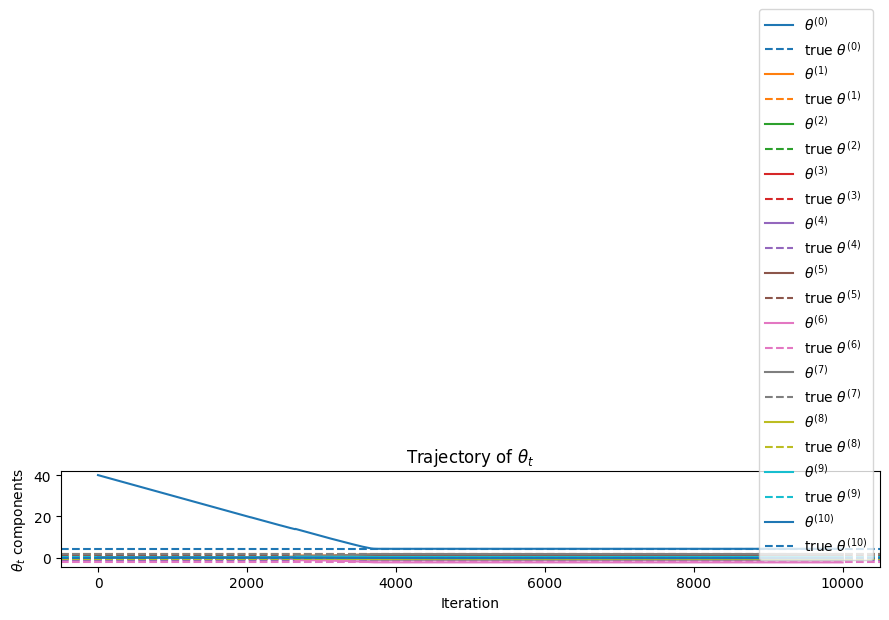

running unsafe SGD...
Final theta: [-1.30000000e+02  2.02998645e-02  2.71642641e-03 -4.55147434e-03
 -4.65774022e-03  5.04326835e-03  2.67086755e-02 -1.42328360e-03
 -3.69130804e-03  4.01779248e-02  1.00718588e-02]


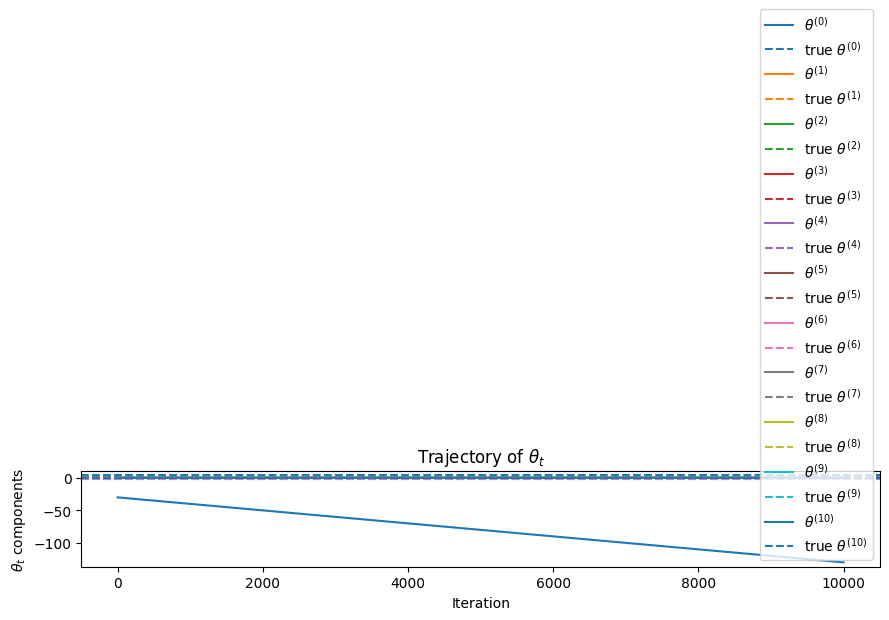

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
Final theta: [ 4.27080658  1.62735687 -0.61584752 -0.52791124 -1.07408727  0.86212049
 -2.31490453  1.74009233 -0.76143167  0.32478254 -0.23594226]


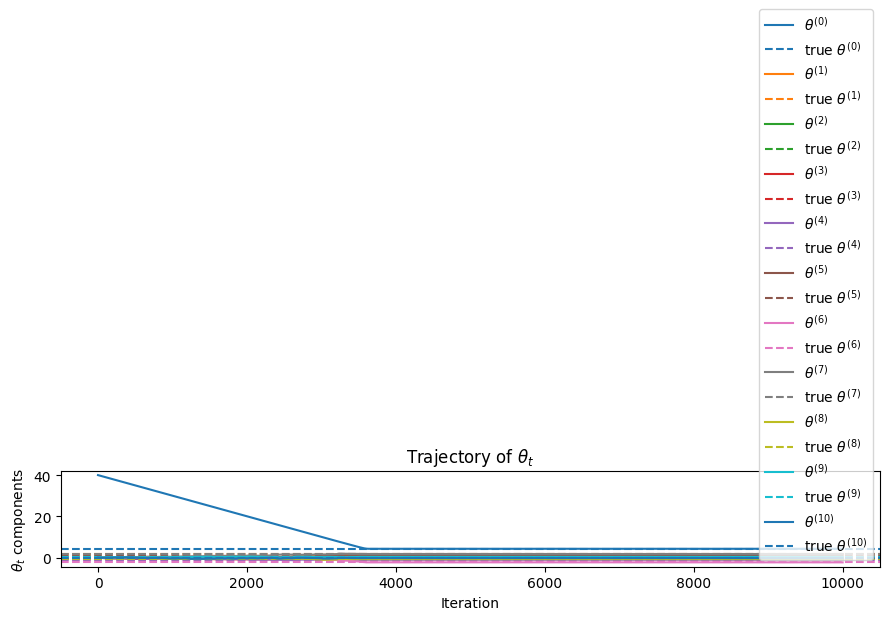

running unsafe Adam...
Final theta: [-1.29999999e+02  1.31140111e+00  1.73969189e-01 -3.29379706e-01
 -3.19932534e-01  2.26983310e-01  1.73311544e+00  3.54659534e-02
 -1.83161523e-01  2.55045940e+00  6.02604293e-01]


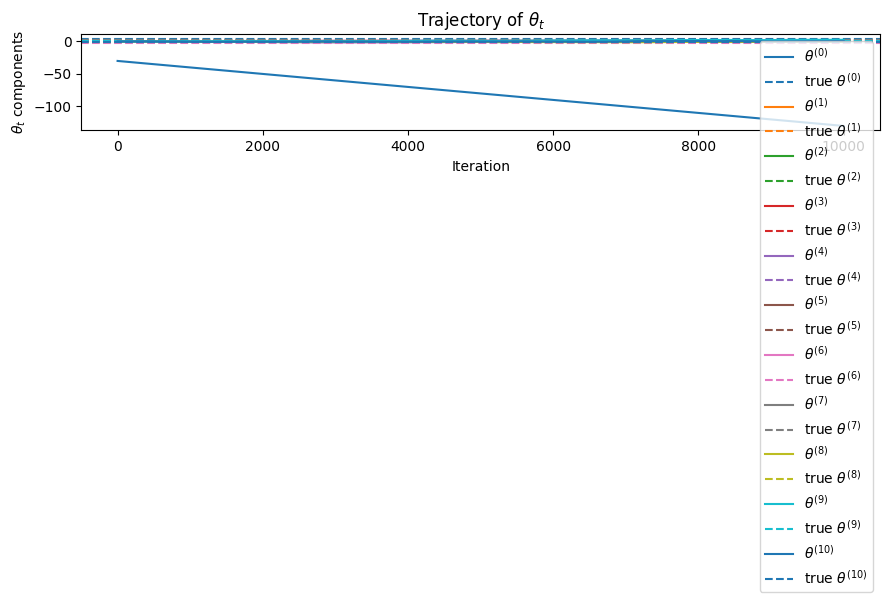

running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
{'SGD_Safe': array([[ 4.00000000e+01,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 3.99900000e+01, -1.84351546e-04, -6.37155858e-05, ...,
         2.72785763e-06,  2.51916816e-04, -2.05523251e-04],
       [ 3.99800000e+01, -2.70093137e-06, -6.42690107e-05, ...,
         1.80407512e-05,  7.59965315e-05, -6.46144713e-05],
       ...,
       [ 4.26706020e+00,  1.62550342e+00, -6.10464221e-01, ...,
        -7.62648536e-01,  3.18559734e-01, -2.48092510e-01],
       [ 4.26714280e+00,  1.62487087e+00,

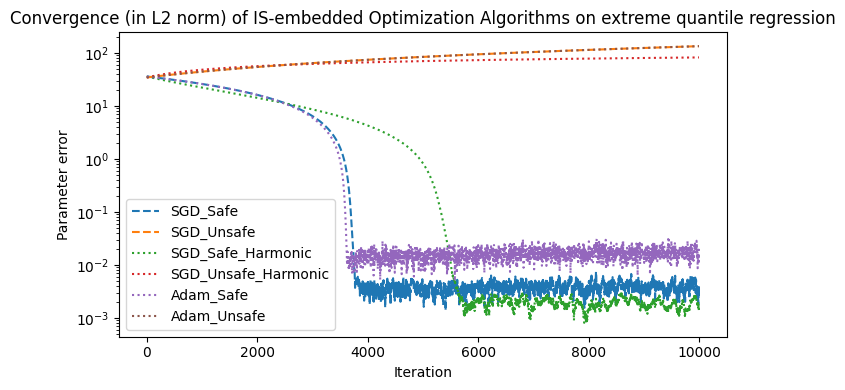

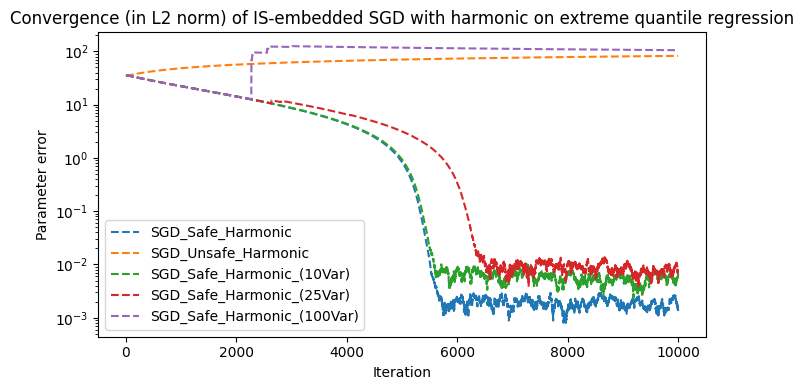

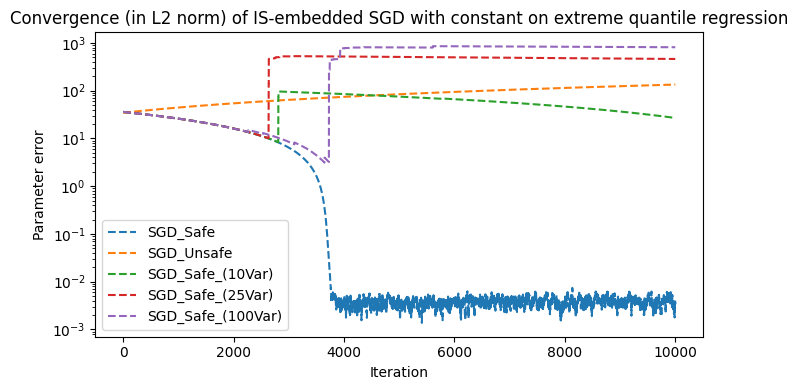

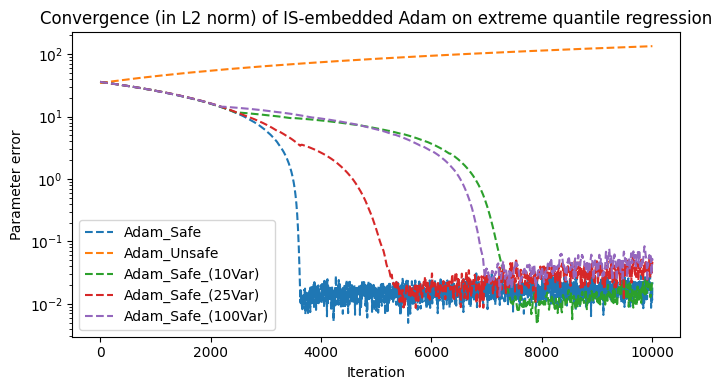

In [12]:
N_dim = 10
np.random.seed(1)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 10000, 
    batch_size=4000,
    check_var = True)

In [ ]:
N_dim = 1000
np.random.seed(1)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000)

true_theta: [ 1.62434536e+00 -6.11756414e-01 -5.28171752e-01 -1.07296862e+00
  8.65407629e-01 -2.30153870e+00  1.74481176e+00 -7.61206901e-01
  3.19039096e-01 -2.49370375e-01  1.46210794e+00 -2.06014071e+00
 -3.22417204e-01 -3.84054355e-01  1.13376944e+00 -1.09989127e+00
 -1.72428208e-01 -8.77858418e-01  4.22137467e-02  5.82815214e-01
 -1.10061918e+00  1.14472371e+00  9.01590721e-01  5.02494339e-01
  9.00855949e-01 -6.83727859e-01 -1.22890226e-01 -9.35769434e-01
 -2.67888080e-01  5.30355467e-01 -6.91660752e-01 -3.96753527e-01
 -6.87172700e-01 -8.45205641e-01 -6.71246131e-01 -1.26645989e-02
 -1.11731035e+00  2.34415698e-01  1.65980218e+00  7.42044161e-01
 -1.91835552e-01 -8.87628964e-01 -7.47158294e-01  1.69245460e+00
  5.08077548e-02 -6.36995647e-01  1.90915485e-01  2.10025514e+00
  1.20158952e-01  6.17203110e-01  3.00170320e-01 -3.52249846e-01
 -1.14251820e+00 -3.49342722e-01 -2.08894233e-01  5.86623191e-01
  8.38983414e-01  9.31102081e-01  2.85587325e-01  8.85141164e-01
 -7.54397941e

KeyboardInterrupt: 

true_theta: [ 1.62434536 -0.61175641 -0.52817175 -1.07296862  0.86540763 -2.3015387
  1.74481176 -0.7612069   0.3190391  -0.24937038  1.46210794 -2.06014071
 -0.3224172  -0.38405435  1.13376944 -1.09989127 -0.17242821 -0.87785842
  0.04221375  0.58281521 -1.10061918  1.14472371  0.90159072  0.50249434
  0.90085595 -0.68372786 -0.12289023 -0.93576943 -0.26788808  0.53035547
 -0.69166075 -0.39675353 -0.6871727  -0.84520564 -0.67124613 -0.0126646
 -1.11731035  0.2344157   1.65980218  0.74204416 -0.19183555 -0.88762896
 -0.74715829  1.6924546   0.05080775 -0.63699565  0.19091548  2.10025514
  0.12015895  0.61720311  0.30017032 -0.35224985 -1.1425182  -0.34934272
 -0.20889423  0.58662319  0.83898341  0.93110208  0.28558733  0.88514116
 -0.75439794  1.25286816  0.51292982 -0.29809284  0.48851815 -0.07557171
  1.13162939  1.51981682  2.18557541 -1.39649634 -1.44411381 -0.50446586
  0.16003707  0.87616892  0.31563495 -2.02220122 -0.30620401  0.82797464
  0.23009474  0.76201118 -0.22232814 -0.2

/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


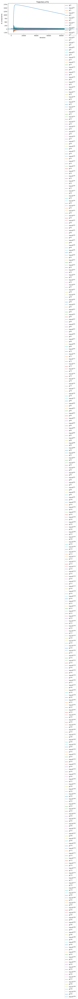

running unsafe SGD...
Final theta: [ 2.60215950e+03 -2.00829557e+01 -8.90740470e+01  2.83886119e+01
 -2.16740057e+01  1.34431273e+01  8.01955478e+01  3.38287766e+01
 -4.03331398e+01 -9.74531021e+01 -4.63120927e+01  2.41408867e+01
  5.07659246e+01  6.57184049e+01  3.07715155e+01 -6.96904348e+01
  8.77383617e+00  8.24494319e+00 -1.23531628e+01  3.32938435e+01
 -1.83252579e+01  3.11111694e+01  4.07260674e+01  6.19359283e+01
  5.89120013e+01  4.89394646e+01 -8.50625394e+01 -1.63133513e+00
  7.73502448e+00  1.17551318e+01 -1.76661448e+01 -5.82475610e+01
  4.07309455e+01  4.31618245e+01 -1.58997180e+01  1.20751900e+01
  1.31150238e+01  5.31250469e+01 -4.51080724e+01  2.54745747e+01
 -9.79790962e+01 -1.52615983e+01  4.34599619e+01  9.00732561e-01
 -2.13911046e+01  7.07438857e+01 -4.79715374e+01 -3.09220609e+01
  2.00041182e+00  1.01007079e+01 -3.51678731e+01 -3.04793791e+01
 -5.00575032e+00 -1.76991037e+01  2.37258018e+01  2.72248418e+01
  2.48443155e+01 -8.33685316e+01 -1.38875933e+01  5.312

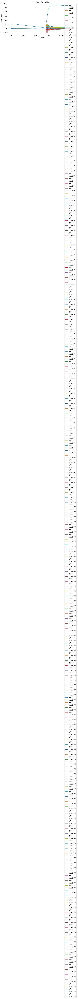

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...


KeyboardInterrupt: 

In [ ]:
N_dim = 200
np.random.seed(1)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000)

running safe SGD...
Final theta: [ 4.26396709  1.62404854 -0.60982837 -0.52647042 -1.07233384  0.86420774
 -2.30082364  1.74442472 -0.76220086  0.31908405 -0.24983517]


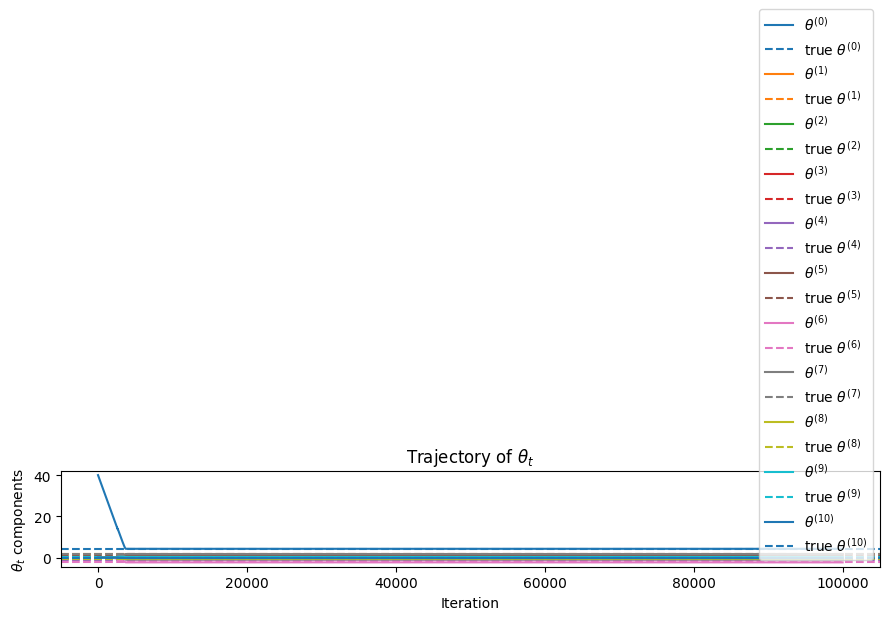

running unsafe SGD...
Final theta: [-1.03000000e+03 -2.93964888e-02 -5.83799289e-02 -5.03297757e-02
  1.36524479e-02  6.70508515e-02  1.10863929e-01 -9.75392852e-03
  4.85818615e-02  4.88372500e-02  4.10903378e-02]


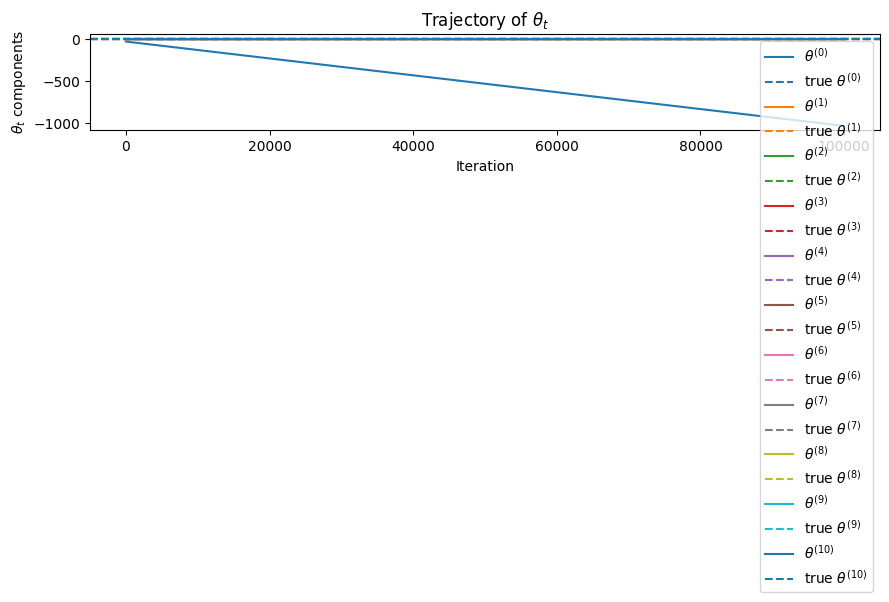

running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe Adam...
running unsafe Adam...
running safe Adam with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...


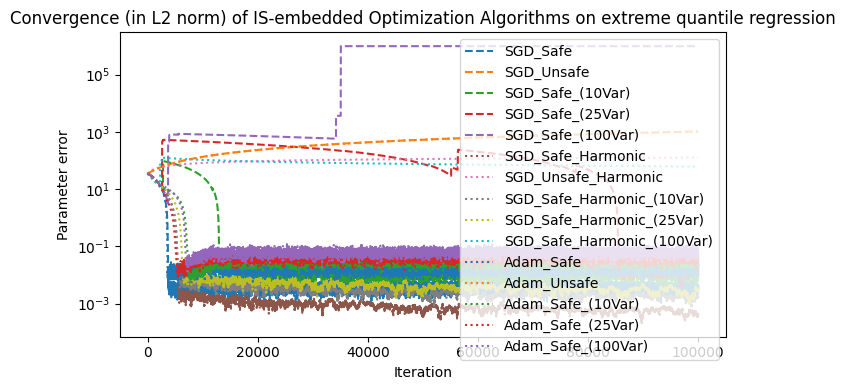

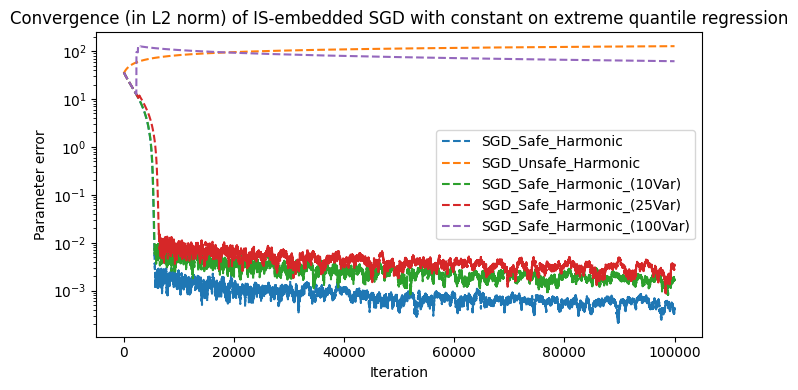

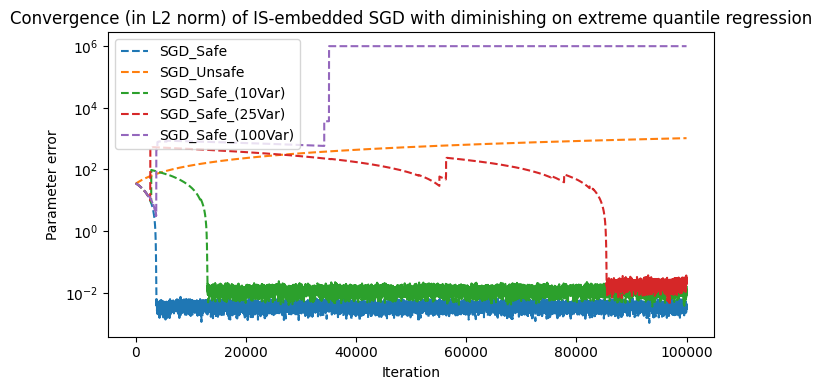

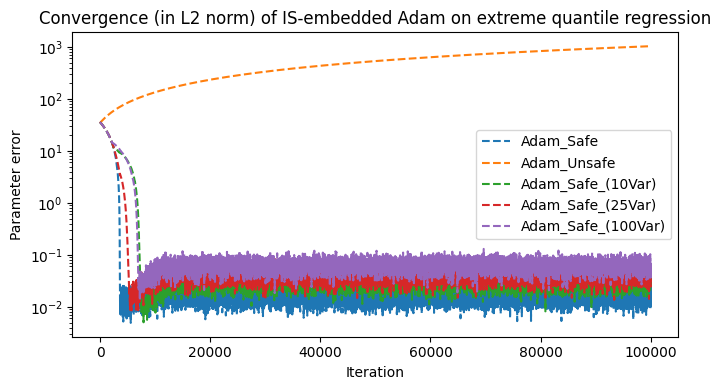

In [ ]:
N_dim = 10
np.random.seed(1)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000)

true_theta: [ -4.16757847  -0.56266827 -21.36196096  16.40270808 -17.93435585
  -8.41747366   5.02881417 -12.45288087 -10.57952219  -9.09007615]
running safe SGD...
Final theta: [  4.26396709  -4.1678753   -0.56074023 -21.36025963  16.40334287
 -17.93555574  -8.4167586    5.02842713 -12.45387483 -10.57947724
  -9.09054094]


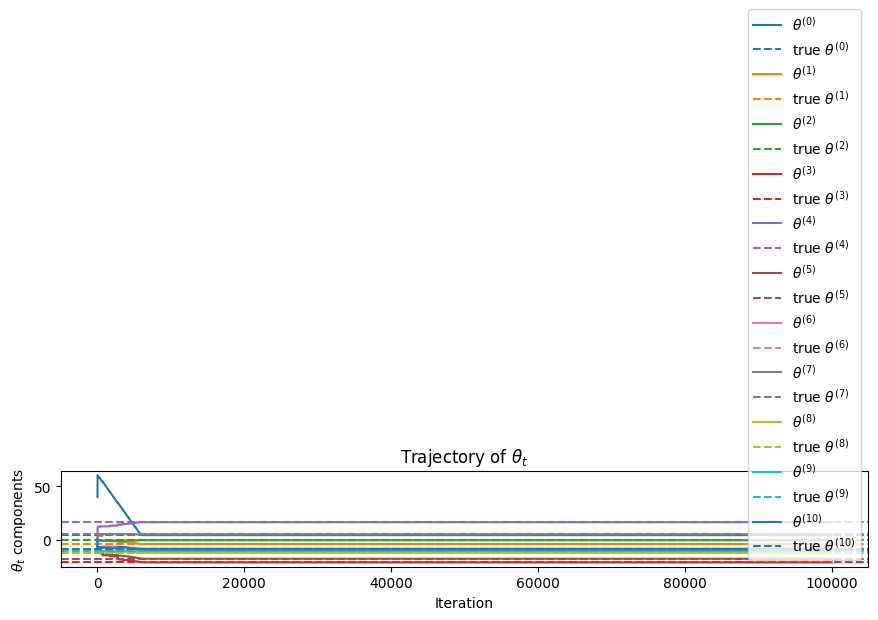

running unsafe SGD...
Final theta: [  4.26396709  -4.1678753   -0.56074023 -21.36025963  16.40334287
 -17.93555574  -8.4167586    5.02842713 -12.45387483 -10.57947724
  -9.09054094]


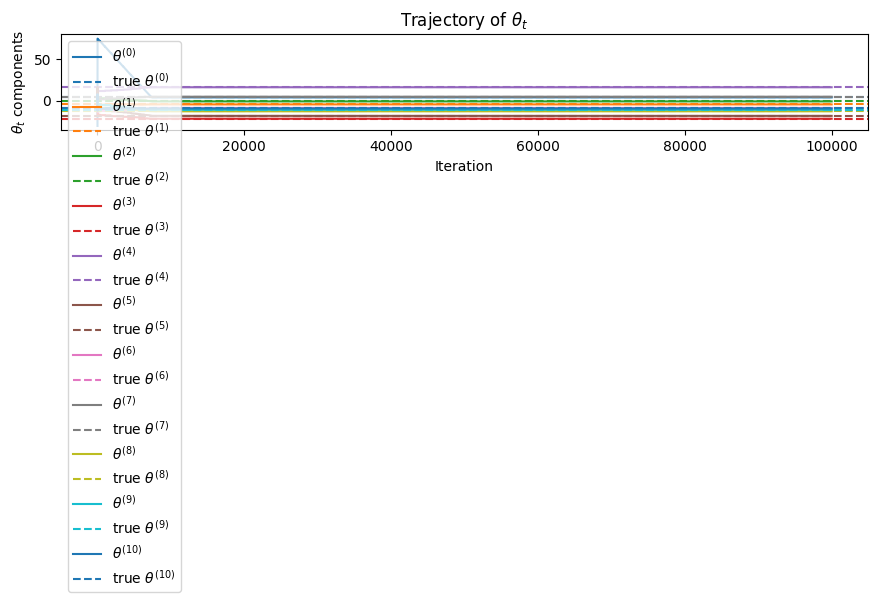

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
Final theta: [  4.25968975  -4.17532442  -0.55945352 -21.35617717  16.4024764
 -17.93774262  -8.42590165   5.03245847 -12.45701883 -10.59105784
  -9.097001  ]


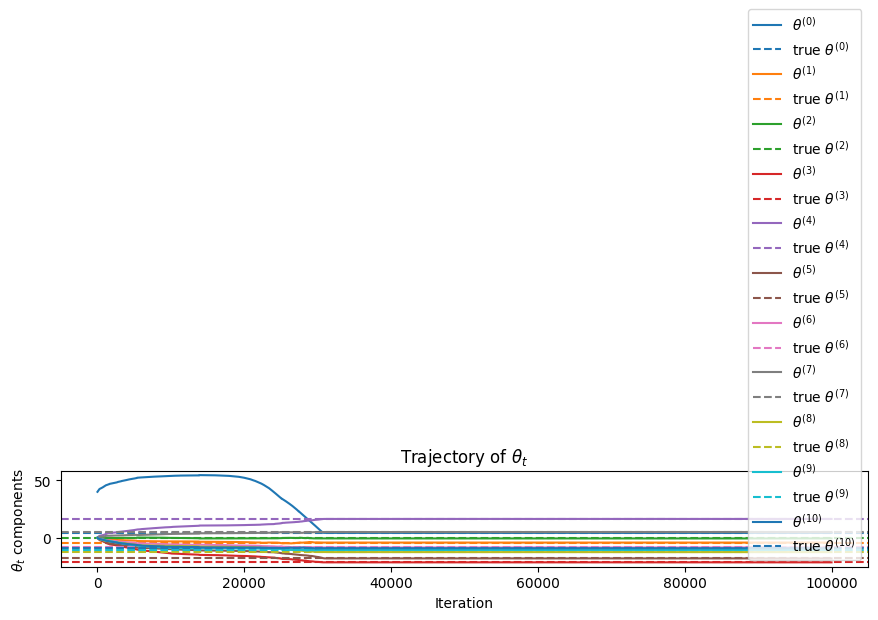

running unsafe Adam...
Final theta: [  4.25968975  -4.17532442  -0.55945352 -21.35617717  16.4024764
 -17.93774262  -8.42590165   5.03245847 -12.45701883 -10.59105784
  -9.097001  ]


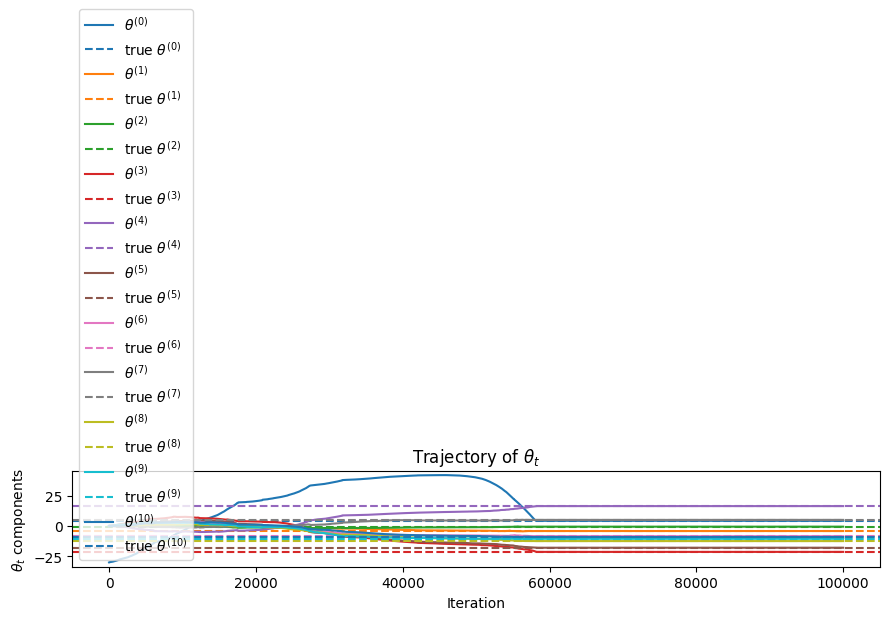

running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
{'SGD_Safe': array([[ 40.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [ 56.32645551,  -1.45778085,  -0.94398552, ...,  -8.65080375,
         -9.97103225,  -8.08220287],
       [ 58.70927334,  -2.26617203,  -1.30241322, ..., -12.88865669,
        -10.66725806,  -6.54984159],
       ...,
       [  4.26427055,  -4.16770038,  -0.5607844 , ..., -12.45388951,
        -10.57967461,  -9.09067997],
       [  4.26376192,  -4.16792783,  -0.56073093, ..., -12.45390216,
        -10.57931408,  -9.09071481],
       

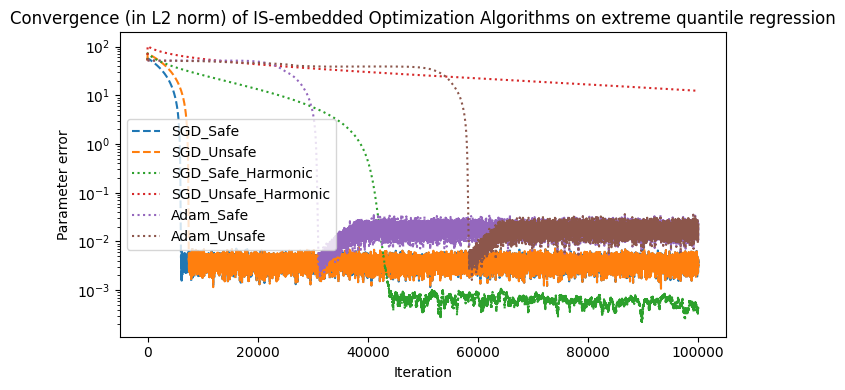

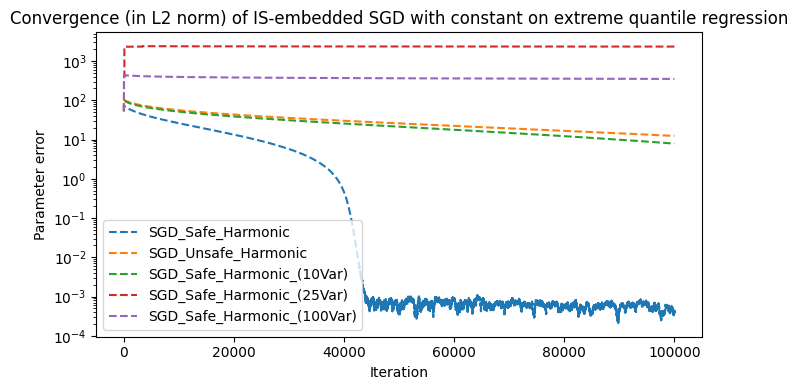

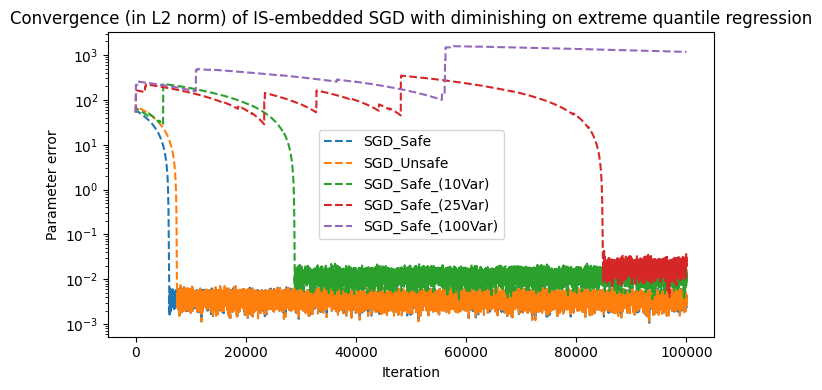

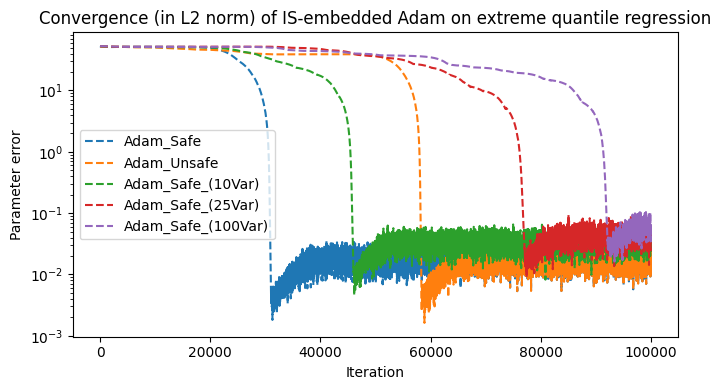

In [ ]:
N_dim = 10
np.random.seed(2)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim, scale = 10.0),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000,
    check_var = True)

true_theta: [-0.41675785 -0.05626683 -2.1361961   1.64027081 -1.79343559 -0.84174737
  0.50288142 -1.24528809 -1.05795222 -0.90900761]
running safe SGD...
Final theta: [ 4.26396709 -0.41705467 -0.05433878 -2.13449477  1.64090559 -1.79463548
 -0.84103231  0.50249437 -1.24628205 -1.05790727 -0.90947241]


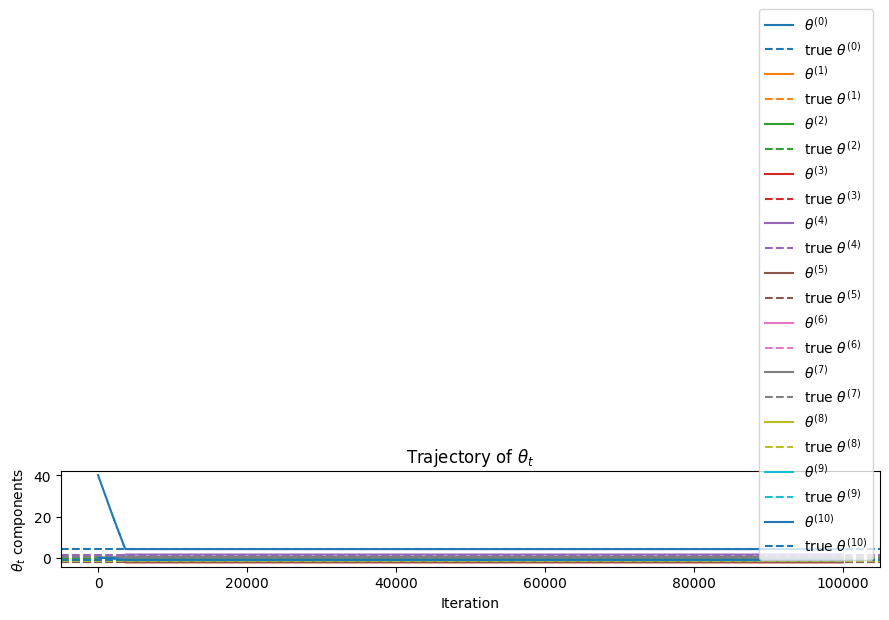

running unsafe SGD...
Final theta: [-1.03000000e+03 -2.93964888e-02 -5.83799289e-02 -5.03297757e-02
  1.36524479e-02  6.70508515e-02  1.10863929e-01 -9.75392852e-03
  4.85818615e-02  4.88372500e-02  4.10903378e-02]


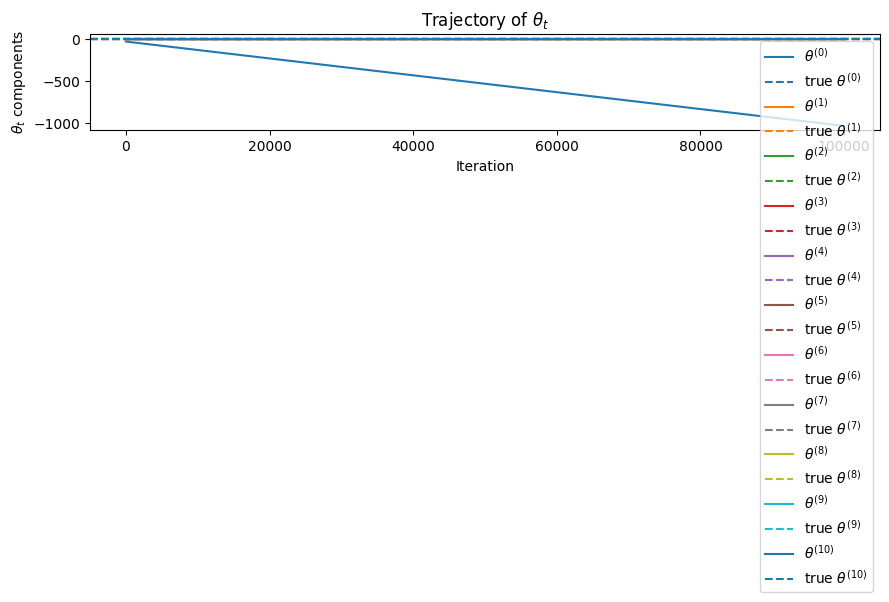

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
Final theta: [ 4.25968975 -0.4245038  -0.05305208 -2.1304123   1.64003912 -1.79682235
 -0.85017536  0.50652571 -1.24942605 -1.06948787 -0.91593246]


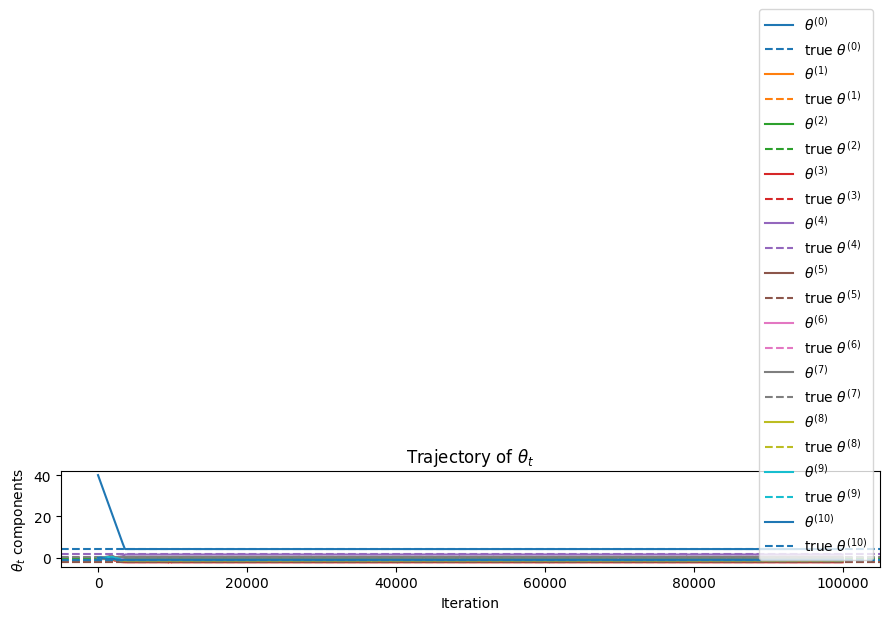

running unsafe Adam...
Final theta: [-1.02999999e+03 -1.84697834e+00 -3.72197074e+00 -3.14646683e+00
  7.79497590e-01  4.23666546e+00  7.03668369e+00 -5.17844549e-01
  3.12271099e+00  3.06598383e+00  2.57298863e+00]


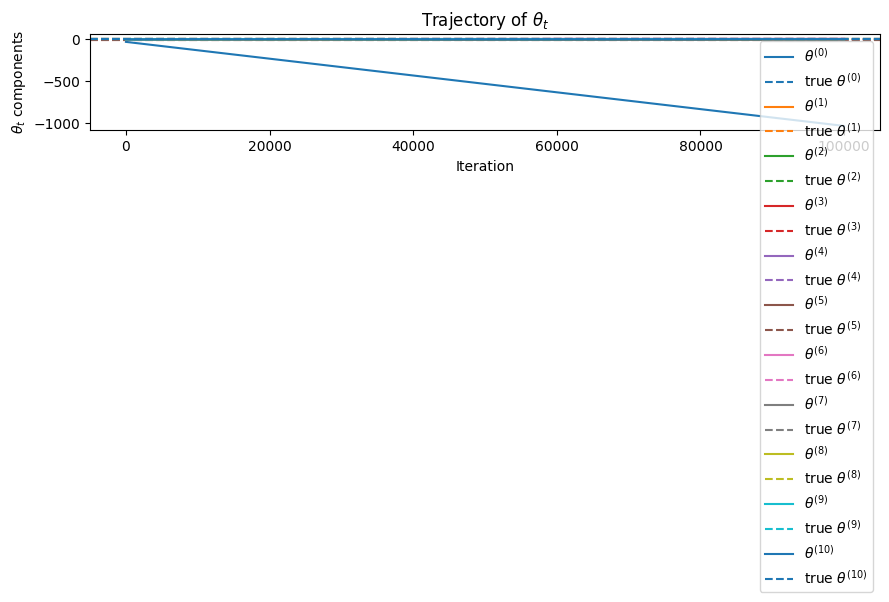

running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
{'SGD_Safe': array([[ 4.00000000e+01,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 3.99900000e+01, -1.84351546e-04, -6.37155858e-05, ...,
         2.72785763e-06,  2.51916816e-04, -2.05523251e-04],
       [ 3.99800000e+01, -2.70093137e-06, -6.42690107e-05, ...,
         1.80407512e-05,  7.59965315e-05, -6.46144713e-05],
       ...,
       [ 4.26427055e+00, -4.16879751e-01, -5.43829504e-02, ...,
        -1.24629673e+00, -1.05810464e+00, -9.09611431e-01],
       [ 4.26376192e+00, -4.17107202e-01,

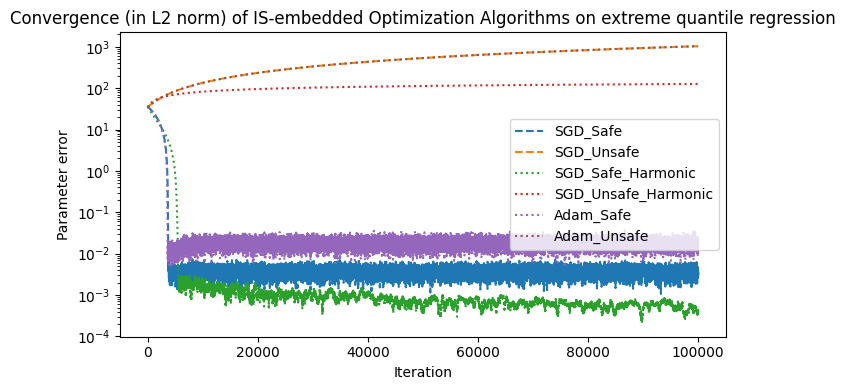

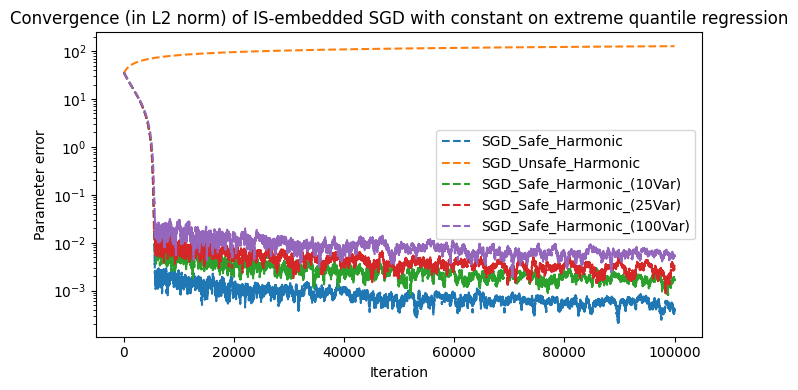

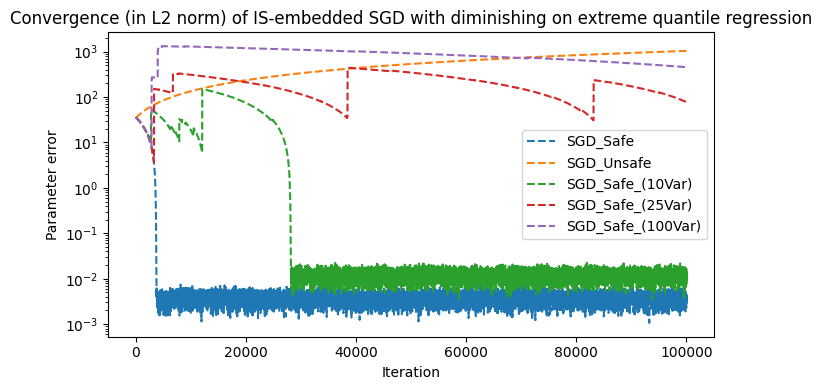

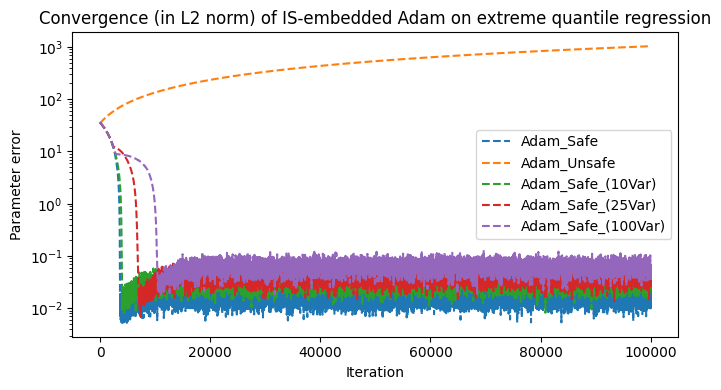

In [ ]:
N_dim = 10
np.random.seed(2)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000,
    check_var = True)

true_theta: [-4.16757847e-01 -5.62668272e-02 -2.13619610e+00  1.64027081e+00
 -1.79343559e+00 -8.41747366e-01  5.02881417e-01 -1.24528809e+00
 -1.05795222e+00 -9.09007615e-01  5.51454045e-01  2.29220801e+00
  4.15393930e-02 -1.11792545e+00  5.39058321e-01 -5.96159700e-01
 -1.91304965e-02  1.17500122e+00 -7.47870949e-01  9.02525097e-03
 -8.78107893e-01 -1.56434170e-01  2.56570452e-01 -9.88779049e-01
 -3.38821966e-01 -2.36184031e-01 -6.37655012e-01 -1.18761229e+00
 -1.42121723e+00 -1.53495196e-01 -2.69056960e-01  2.23136679e+00
 -2.43476758e+00  1.12726505e-01  3.70444537e-01  1.35963386e+00
  5.01857207e-01 -8.44213704e-01  9.76147160e-06  5.42352572e-01
 -3.13508197e-01  7.71011738e-01 -1.86809065e+00  1.73118467e+00
  1.46767801e+00 -3.35677339e-01  6.11340780e-01  4.79705919e-02
 -8.29135289e-01  8.77102184e-02  1.00036589e+00 -3.81092518e-01
 -3.75669423e-01 -7.44707629e-02  4.33496330e-01  1.27837923e+00
 -6.34679305e-01  5.08396243e-01  2.16116006e-01 -1.85861239e+00
 -4.19316482e

/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


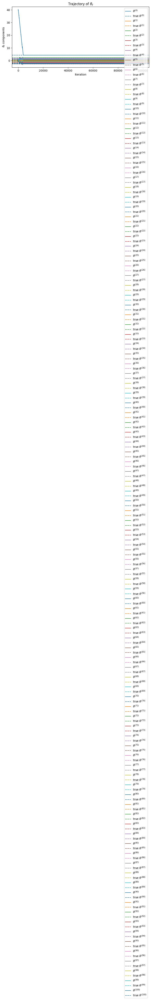

running unsafe SGD...
Final theta: [ 3.49669027e+03 -1.49114327e+00  4.60502337e+01 -5.21409534e+01
 -8.89429709e+01 -1.33937959e+02 -7.08584134e+01  5.10769576e+01
  1.04358138e+02 -9.72066087e+01 -5.36609598e+01  1.93468473e+02
 -8.29420018e+01 -1.20277003e+02  5.36323503e+01  9.78416033e+01
  3.77614651e+01 -4.21645288e+00 -7.10764204e+01 -1.65584821e+02
  7.47004415e+01 -4.06203547e+01 -1.49695650e+02 -5.64269833e+01
  3.40557043e+01  9.71423927e+01  2.29060731e+01  8.11660917e+01
  6.36504326e+01 -4.54073090e+01 -1.07578300e+02  4.89135398e+01
  1.61034793e+02  6.43422744e+01  1.73866485e+02 -9.22119991e+00
 -1.53911328e+01  6.07921983e+01 -6.54182919e+01 -1.32653379e+02
  1.61372998e+02  9.58596664e+01  2.10713713e+01  8.16210945e+01
 -1.33760404e+02  5.12885014e+01 -2.33997832e+02 -2.31113601e+01
 -1.51381288e+02 -1.70037755e+02 -1.13753135e+02 -1.35880747e+02
  1.62689817e+01  2.37335275e+01 -1.60689380e+01 -9.21351086e+01
  3.61999061e+00 -5.24504327e+01  7.79705335e+01 -7.139

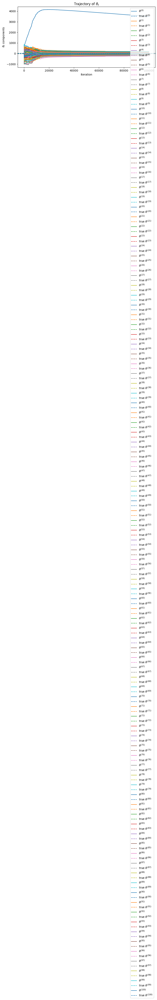

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
Final theta: [ 4.27502531e+00 -4.28386423e-01 -5.54703258e-02 -2.13818564e+00
  1.64375001e+00 -1.79685648e+00 -8.37937987e-01  4.81692687e-01
 -1.24080147e+00 -1.06702577e+00 -9.12900209e-01  5.53827847e-01
  2.28842489e+00  4.07346554e-02 -1.10886688e+00  5.30099225e-01
 -5.98733716e-01 -2.65492022e-02  1.17782441e+00 -7.43988711e-01
  6.48481298e-03 -8.71127761e-01 -1.62259914e-01  2.59452853e-01
 -9.96132216e-01 -3.31728256e-01 -2.27422349e-01 -6.39453053e-01
 -1.18566486e+00 -1.43015400e+00 -1.48990249e-01 -2.62977709e-01
  2.23283444e+00 -2.43962355e+00  1.14524575e-01  3.75567225e-01
  1.36388584e+00  4.98223541e-01 -8.46410057e-01 -2.56951399e-03
  5.50430616e-01 -3.08717275e-01  7.73033261e-01 -1.87003225e+00
  1.74028326e+00  1.46736104e+00 -3.20944049e-01  6.09452846e-01
  4.70593051e-02 -8.33224481e-01  8.77636577e-02  1.00555630e+00
 -3.77214936e-01 -3.74172917e-0

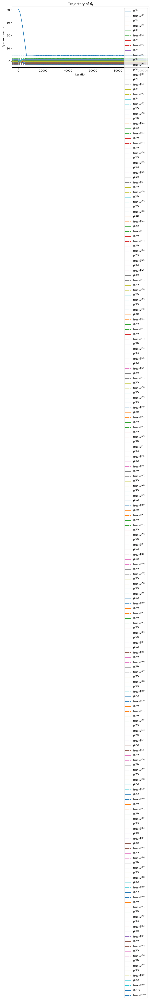

running unsafe Adam...
Final theta: [ 4.27502531e+00 -4.28386423e-01 -5.54703258e-02 -2.13818564e+00
  1.64375001e+00 -1.79685648e+00 -8.37937987e-01  4.81692687e-01
 -1.24080147e+00 -1.06702577e+00 -9.12900209e-01  5.53827847e-01
  2.28842489e+00  4.07346554e-02 -1.10886688e+00  5.30099225e-01
 -5.98733716e-01 -2.65492022e-02  1.17782441e+00 -7.43988711e-01
  6.48481298e-03 -8.71127761e-01 -1.62259914e-01  2.59452853e-01
 -9.96132216e-01 -3.31728256e-01 -2.27422349e-01 -6.39453053e-01
 -1.18566486e+00 -1.43015400e+00 -1.48990249e-01 -2.62977709e-01
  2.23283444e+00 -2.43962355e+00  1.14524575e-01  3.75567225e-01
  1.36388584e+00  4.98223541e-01 -8.46410057e-01 -2.56951399e-03
  5.50430616e-01 -3.08717275e-01  7.73033261e-01 -1.87003225e+00
  1.74028326e+00  1.46736104e+00 -3.20944049e-01  6.09452846e-01
  4.70593051e-02 -8.33224481e-01  8.77636577e-02  1.00555630e+00
 -3.77214936e-01 -3.74172917e-01 -7.29209006e-02  4.29460135e-01
  1.27900201e+00 -6.29895146e-01  5.12617337e-01  2.16

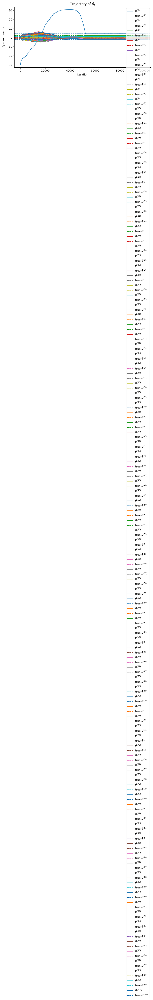

running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
{'SGD_Safe': array([[ 4.00000000e+01,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 3.99900409e+01,  1.54082008e-04, -2.39049496e-04, ...,
        -7.91003394e-05,  4.61161256e-06, -6.19083931e-05],
       [ 4.02807446e+01,  3.75320906e-02, -5.56497371e-01, ...,
        -5.98873403e-02, -6.14817533e-02, -1.29828412e-01],
       ...,
       [ 4.26490740e+00, -4.16240571e-01, -5.61406501e-02, ...,
        -2.18737280e-01,  1.17563578e+00, -2.34214945e+00],
       [ 4.26448145e+00, -4.16557682e-01,

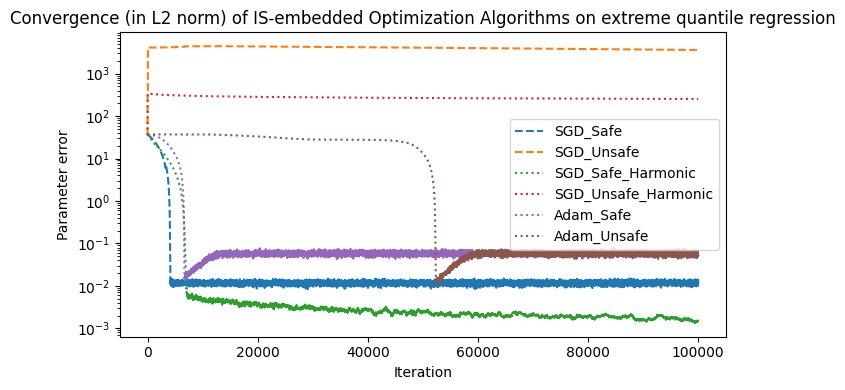

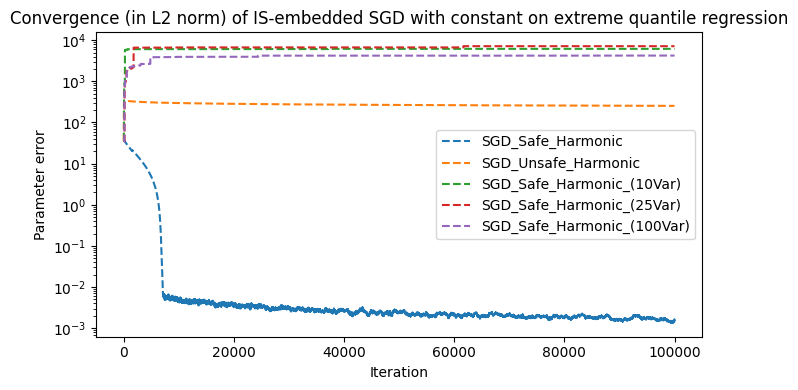

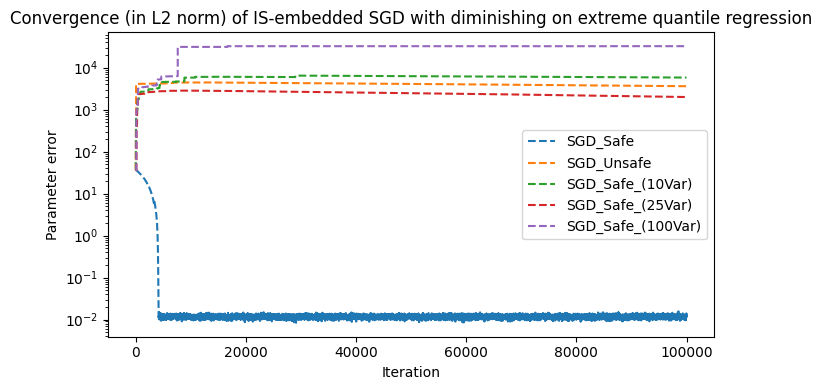

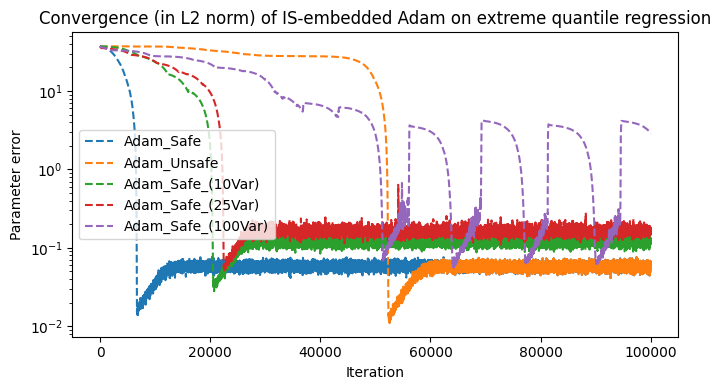

In [ ]:
N_dim = 100
np.random.seed(2)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000,
    check_var = True)

true_theta: [ 1.62434536 -0.61175641 -0.52817175 -1.07296862  0.86540763 -2.3015387
  1.74481176 -0.7612069   0.3190391  -0.24937038  1.46210794 -2.06014071
 -0.3224172  -0.38405435  1.13376944 -1.09989127 -0.17242821 -0.87785842
  0.04221375  0.58281521 -1.10061918  1.14472371  0.90159072  0.50249434
  0.90085595 -0.68372786 -0.12289023 -0.93576943 -0.26788808  0.53035547
 -0.69166075 -0.39675353 -0.6871727  -0.84520564 -0.67124613 -0.0126646
 -1.11731035  0.2344157   1.65980218  0.74204416 -0.19183555 -0.88762896
 -0.74715829  1.6924546   0.05080775 -0.63699565  0.19091548  2.10025514
  0.12015895  0.61720311]
running safe SGD...
Final theta: [ 4.26602894  1.6245645  -0.61043751 -0.52635151 -1.07596532  0.8643213
 -2.30194754  1.7463202  -0.76160411  0.31857324 -0.24910459  1.46191914
 -2.05902879 -0.32273331 -0.38599476  1.1331505  -1.09948842 -0.17304552
 -0.87789719  0.04327136  0.58261311 -1.10072149  1.14288239  0.90007651
  0.50189325  0.90282463 -0.6815918  -0.12334725 -0.9348

/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


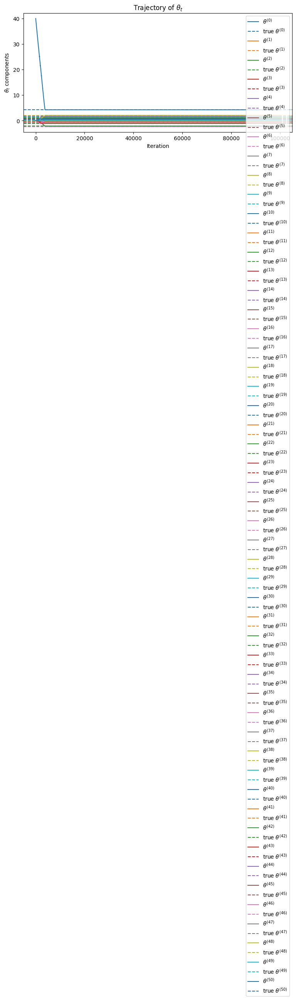

running unsafe SGD...
Final theta: [ 4.26602894  1.6245645  -0.61043751 -0.52635151 -1.07596532  0.8643213
 -2.30194754  1.7463202  -0.76160411  0.31857324 -0.24910459  1.46191914
 -2.05902879 -0.32273331 -0.38599476  1.1331505  -1.09948842 -0.17304552
 -0.87789719  0.04327136  0.58261311 -1.10072149  1.14288239  0.90007651
  0.50189325  0.90282463 -0.6815918  -0.12334725 -0.93485183 -0.2669013
  0.52996819 -0.69059934 -0.39774407 -0.68785575 -0.84518843 -0.6730557
 -0.01177827 -1.11575636  0.23436363  1.66018541  0.74407306 -0.19375756
 -0.88558    -0.74525225  1.69253075  0.0486369  -0.63749979  0.18981009
  2.09988721  0.11906619  0.61623466]


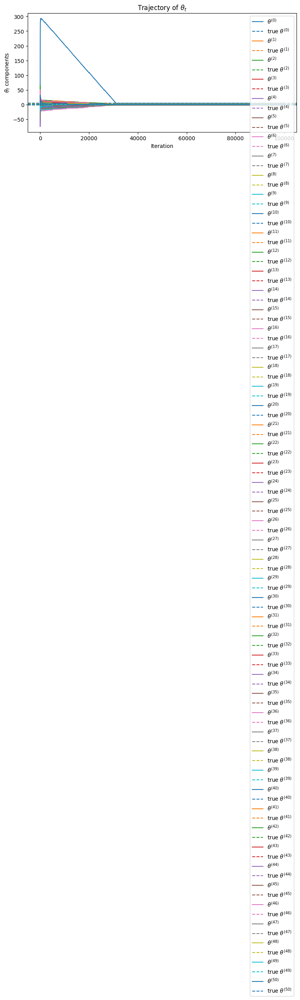

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
Final theta: [ 4.26358429  1.62594741 -0.60668755 -0.52235187 -1.07846854  0.86150892
 -2.3129237   1.7573747  -0.76371458  0.31566747 -0.2369109   1.4688503
 -2.05806241 -0.3236022  -0.38835764  1.13514462 -1.10458962 -0.17822477
 -0.88317572  0.04724772  0.58722456 -1.09836906  1.13753081  0.89902941
  0.50690349  0.89807606 -0.6794481  -0.1325404  -0.94058619 -0.25838441
  0.53035656 -0.67979697 -0.39153497 -0.68887403 -0.84128768 -0.68372939
 -0.0159735  -1.11260786  0.220917    1.67072633  0.75084821 -0.19010504
 -0.88572315 -0.73458057  1.69654892  0.03948879 -0.63908253  0.19238339
  2.09772524  0.12131198  0.61559128]


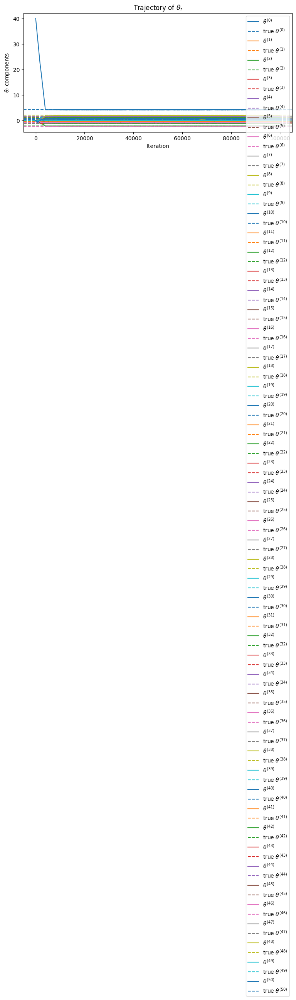

running unsafe Adam...
Final theta: [ 4.26358429  1.62594741 -0.60668755 -0.52235187 -1.07846854  0.86150892
 -2.3129237   1.7573747  -0.76371458  0.31566747 -0.2369109   1.4688503
 -2.05806241 -0.3236022  -0.38835764  1.13514462 -1.10458962 -0.17822477
 -0.88317572  0.04724772  0.58722456 -1.09836906  1.13753081  0.89902941
  0.50690349  0.89807606 -0.6794481  -0.1325404  -0.94058619 -0.25838441
  0.53035656 -0.67979697 -0.39153497 -0.68887403 -0.84128768 -0.68372939
 -0.0159735  -1.11260786  0.220917    1.67072633  0.75084821 -0.19010504
 -0.88572315 -0.73458057  1.69654892  0.03948879 -0.63908253  0.19238339
  2.09772524  0.12131198  0.61559128]


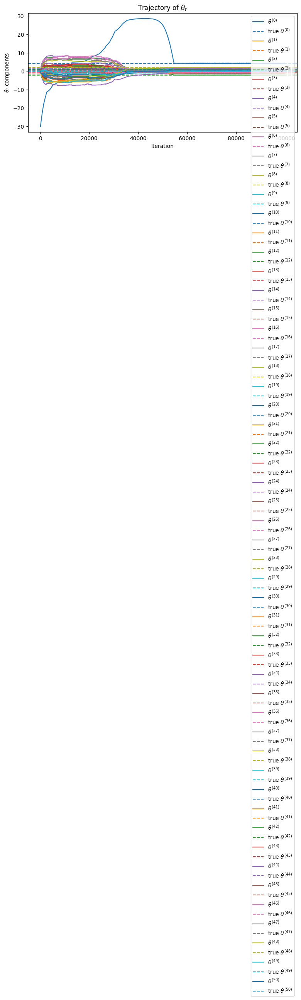

running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
{'SGD_Safe': array([[ 4.00000000e+01,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 3.99900000e+01,  2.07175172e-04, -7.50938044e-05, ...,
         2.43790284e-05, -1.70302340e-04,  1.13842179e-04],
       [ 3.99800000e+01,  3.50360716e-04, -5.78106092e-05, ...,
        -1.00625956e-04, -1.91433936e-04, -1.76767772e-05],
       ...,
       [ 4.26693187e+00,  1.62484488e+00, -6.10586207e-01, ...,
         2.10007141e+00,  1.18859156e-01,  6.16013119e-01],
       [ 4.26656254e+00,  1.62503638e+00,

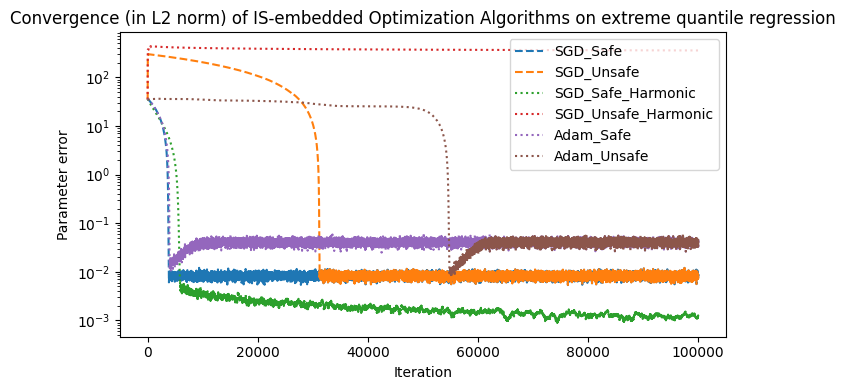

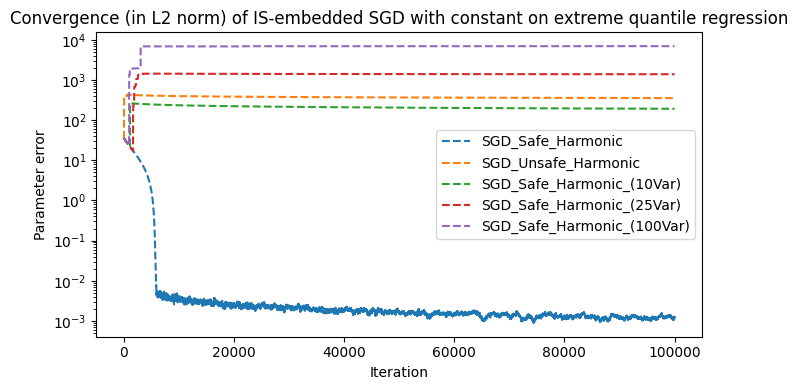

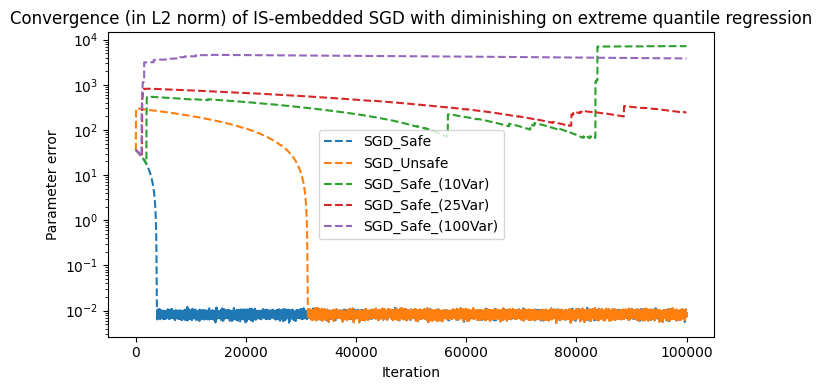

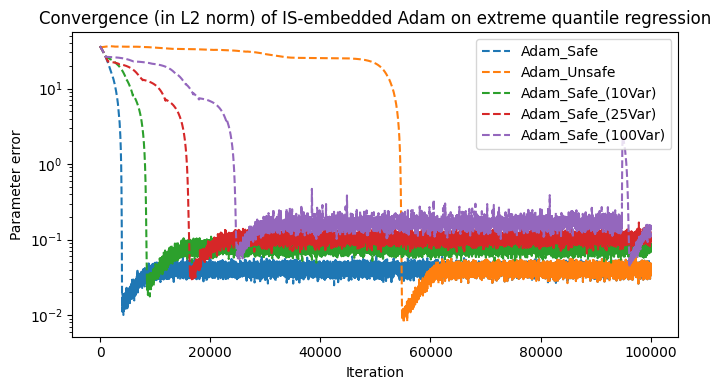

In [ ]:
N_dim = 50
np.random.seed(1)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000,
    check_var = True)

true_theta: [ 1.78862847  0.43650985  0.09649747 -1.8634927  -0.2773882  -0.35475898
 -0.08274148 -0.62700068 -0.04381817 -0.47721803 -1.31386475  0.88462238
  0.88131804  1.70957306  0.05003364 -0.40467741 -0.54535995 -1.54647732
  0.98236743 -1.10106763 -1.18504653 -0.2056499   1.48614836  0.23671627
 -1.02378514 -0.7129932   0.62524497 -0.16051336 -0.76883635 -0.23003072
  0.74505627  1.97611078 -1.24412333 -0.62641691 -0.80376609 -2.41908317
 -0.92379202 -1.02387576  1.12397796 -0.13191423 -1.62328545  0.64667545
 -0.35627076 -1.74314104 -0.59664964 -0.58859438 -0.8738823   0.02971382
 -2.24825777 -0.26776186  1.01318344  0.85279784  1.1081875   1.11939066
  1.48754313 -1.11830068  0.84583341 -1.86088953 -0.6028851  -1.91447204
  1.04814751  1.33373782 -0.19741468  1.77464503 -0.67472751  0.15061687
  0.1529457  -1.06419527  0.43794661  1.93897846 -1.02493087  0.89933845
 -0.15450685  1.7696273   0.48378835  0.6762164   0.64316328  0.24908671
 -1.3957635   1.39166291 -1.37066901  0

/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/Users/wasinmeesena/Library/Python/3.9/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


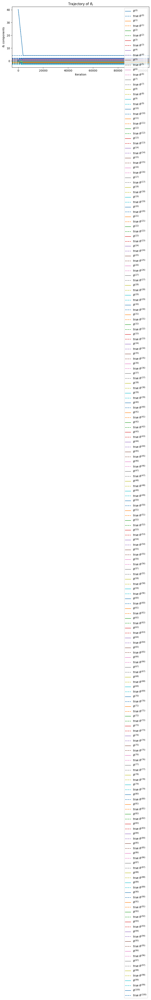

running unsafe SGD...
Final theta: [ 5.84626082e+02  1.69601972e+01 -1.46326461e+01 -9.42991555e-01
  7.18663345e+00  4.42226838e-01 -1.45397001e+01 -2.31631204e+01
 -1.91464541e+01 -1.66106799e+01  2.38479432e+01 -2.13865094e+00
 -1.19326212e+01  9.77707448e+00  6.60811001e+00  1.21970696e+00
 -7.09394200e+00  2.46223618e+01 -3.32461091e+01 -3.26402489e+00
  2.82345271e+00 -5.97461056e+00 -3.17037947e+00  1.72703864e+01
 -1.38854999e+01  1.76563818e+00 -3.97559809e+00  5.86754183e+00
 -2.35566110e+00  2.47899504e+01  7.96196919e+00 -4.51476267e+00
  1.39741605e+01 -3.85173939e+00 -1.83078622e+01 -1.85691382e+01
 -1.12791058e+01 -3.48932724e+00  4.90249043e+00  1.66511853e+01
 -5.40806031e+00 -1.95622700e+01  1.04848536e+01  1.70114020e+01
 -3.70922480e+00 -8.18071507e-01 -1.33022747e+01  1.33238972e+01
 -7.20864303e+00 -2.30216493e+01 -3.26288177e+01  5.32145129e+00
 -8.08262707e+00 -1.12498643e+01  1.45771393e+01 -8.96940077e+00
  3.02643017e+00  9.26309185e+00 -2.93150131e+01  2.740

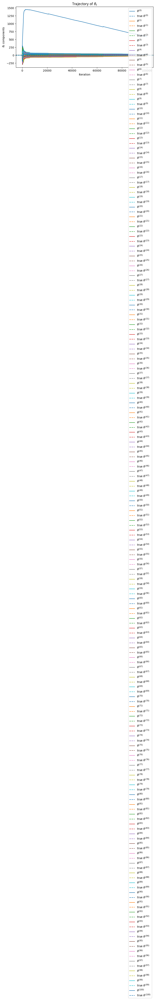

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
Final theta: [ 4.27502531  1.7769999   0.43730635  0.09450792 -1.8600135  -0.2808091
 -0.3509496  -0.10393021 -0.62251406 -0.05289173 -0.48111062 -1.31149095
  0.88083925  0.8805133   1.71863163  0.04107455 -0.40725143 -0.55277865
 -1.54365412  0.98624967 -1.10360807 -1.1780664  -0.21147564  1.48903076
  0.2293631  -1.01669143 -0.70423152  0.62344693 -0.15856594 -0.77777312
 -0.22552578  0.75113552  1.97757844 -1.2489793  -0.62461884 -0.79864341
 -2.41483119 -0.92742569 -1.02607211  1.12139868 -0.12383619 -1.61849452
  0.64869697 -0.35821236 -1.73404245 -0.59696661 -0.57386109 -0.87577023
  0.02880253 -2.25234696 -0.26770843  1.01837386  0.85667542  1.10968401
  1.12094052  1.48350694 -1.1176779   0.85061757 -1.85666843 -0.60279083
 -1.91949618  1.05210001  1.33650203 -0.20318751  1.78276652 -0.67489852
  0.15541747  0.15813118 -1.07417688  0.43855966  1.94779673 -1.02458013
 

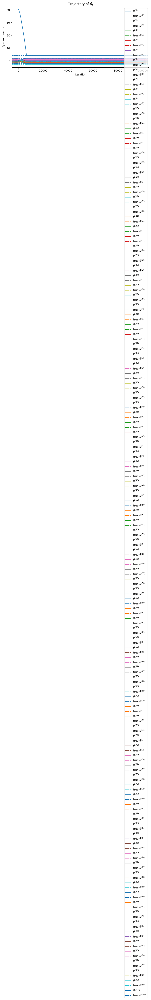

running unsafe Adam...
Final theta: [ 4.27502531  1.7769999   0.43730635  0.09450792 -1.8600135  -0.2808091
 -0.3509496  -0.10393021 -0.62251406 -0.05289173 -0.48111062 -1.31149095
  0.88083925  0.8805133   1.71863163  0.04107455 -0.40725143 -0.55277865
 -1.54365412  0.98624967 -1.10360807 -1.1780664  -0.21147564  1.48903076
  0.2293631  -1.01669143 -0.70423152  0.62344693 -0.15856594 -0.77777312
 -0.22552578  0.75113552  1.97757844 -1.2489793  -0.62461884 -0.79864341
 -2.41483119 -0.92742569 -1.02607211  1.12139868 -0.12383619 -1.61849452
  0.64869697 -0.35821236 -1.73404245 -0.59696661 -0.57386109 -0.87577023
  0.02880253 -2.25234696 -0.26770843  1.01837386  0.85667542  1.10968401
  1.12094052  1.48350694 -1.1176779   0.85061757 -1.85666843 -0.60279083
 -1.91949618  1.05210001  1.33650203 -0.20318751  1.78276652 -0.67489852
  0.15541747  0.15813118 -1.07417688  0.43855966  1.94779673 -1.02458013
  0.90956298 -0.15856179  1.75925926  0.47648238  0.67991696  0.6525451
  0.25199037 -1.3

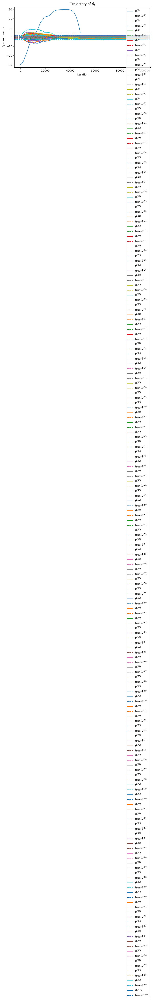

running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
{'SGD_Safe': array([[ 4.00000000e+01,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 3.99900000e+01,  1.46641101e-04, -2.04545955e-04, ...,
        -6.36996987e-06, -3.06156104e-05,  1.27459670e-05],
       [ 3.99800009e+01,  1.31293000e-04, -4.15588865e-04, ...,
         9.95573132e-05,  4.48828038e-05,  2.57024344e-04],
       ...,
       [ 4.26490740e+00,  1.78914575e+00,  4.36636028e-01, ...,
        -8.57039179e-01, -2.98101794e-01,  2.15960308e+00],
       [ 4.26448145e+00,  1.78882864e+00,

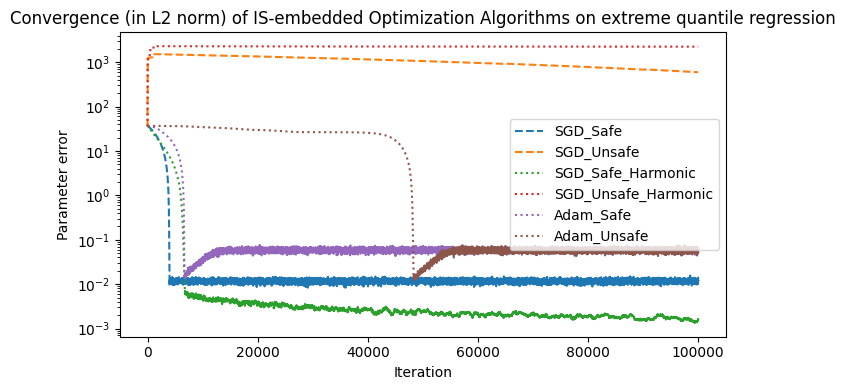

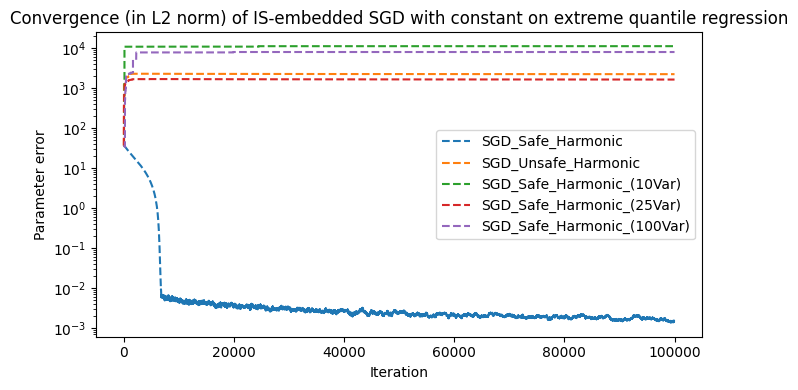

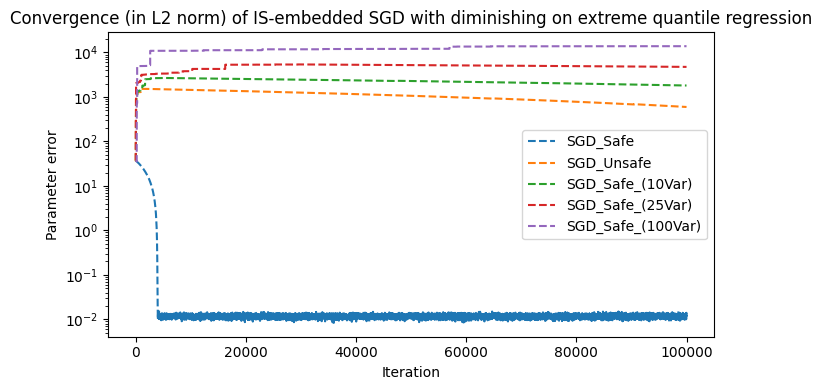

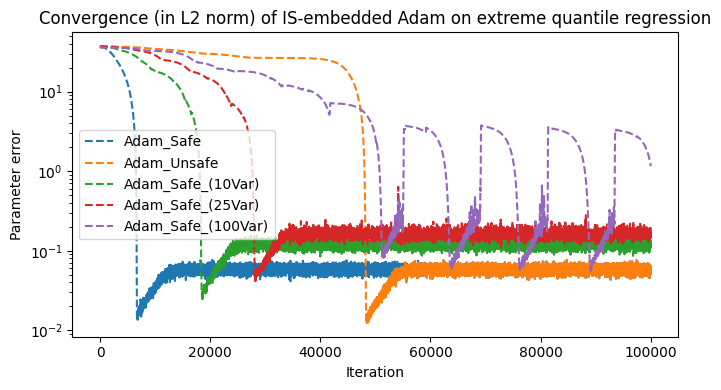

In [ ]:
N_dim = 100
np.random.seed(3)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000,
    check_var = True)

true_theta: [ 1.62434536 -0.61175641 -0.52817175 -1.07296862  0.86540763 -2.3015387
  1.74481176 -0.7612069   0.3190391  -0.24937038  1.46210794 -2.06014071
 -0.3224172  -0.38405435  1.13376944 -1.09989127 -0.17242821 -0.87785842
  0.04221375  0.58281521 -1.10061918  1.14472371  0.90159072  0.50249434
  0.90085595 -0.68372786 -0.12289023 -0.93576943 -0.26788808  0.53035547
 -0.69166075 -0.39675353 -0.6871727  -0.84520564 -0.67124613 -0.0126646
 -1.11731035  0.2344157   1.65980218  0.74204416 -0.19183555 -0.88762896
 -0.74715829  1.6924546   0.05080775 -0.63699565  0.19091548  2.10025514
  0.12015895  0.61720311  0.30017032 -0.35224985 -1.1425182  -0.34934272
 -0.20889423  0.58662319  0.83898341  0.93110208  0.28558733  0.88514116
 -0.75439794  1.25286816  0.51292982 -0.29809284  0.48851815 -0.07557171
  1.13162939  1.51981682  2.18557541 -1.39649634 -1.44411381 -0.50446586
  0.16003707  0.87616892  0.31563495 -2.02220122 -0.30620401  0.82797464
  0.23009474  0.76201118 -0.22232814 -0.2

/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/Users/wasinmeesena/Library/Python/3.9/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


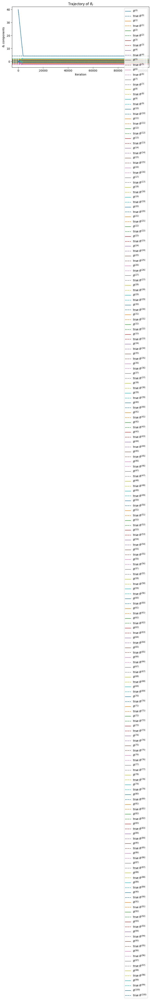

running unsafe SGD...
Final theta: [ 5.80343842e+02  1.53408008e+01  2.06662088e+01 -4.62332112e+00
 -9.84683842e+00  4.51306140e+00 -1.30397132e+01  1.16928611e+00
  6.39014207e+00 -1.67334389e+01 -2.71140935e+01  3.16637052e+00
 -1.36835484e+01  4.14184042e+00 -3.98359666e-01  9.92172151e+00
 -2.83357449e+01 -4.00598476e+00  2.21015318e+01 -3.35915797e-01
  5.04938135e+00  2.69945752e+01  8.21710580e+00  1.08316139e+01
  7.59740250e-01 -1.35458283e+01 -2.29487546e+01 -2.55168993e+01
  5.45249453e+00  6.66429549e-01  1.24836147e+01  1.25102282e+01
  2.16797802e+01  1.03006322e+01 -1.55426543e+01  2.99734444e+01
  1.96076371e+01  2.62457760e+01  3.02179145e+00 -7.79664196e+00
 -4.15467725e+00 -1.46995375e+01 -1.75337048e+01 -8.09490192e+00
  5.12729668e+00  6.26523221e-01 -2.71947870e-01 -6.63440088e+00
  5.50551757e+00  1.01814576e+00  7.46687302e-02  2.74828892e+00
 -4.82790974e+00  2.04316599e+01 -6.97739869e+00  5.21612626e+00
 -3.63776093e+00  1.02885368e+01  1.55617009e+00 -2.404

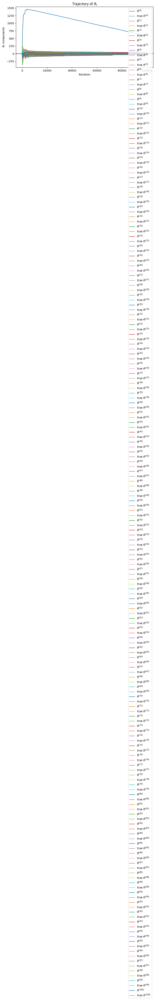

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
Final theta: [ 4.27502531  1.61271679 -0.61095991 -0.5301613  -1.06948942  0.86198674
 -2.29772932  1.72362303 -0.75672029  0.30996554 -0.25326297  1.46448174
 -2.06392384 -0.32322194 -0.37499579  1.12481035 -1.10246528 -0.17984691
 -0.87503522  0.04609599  0.58027478 -1.09363905  1.13889797  0.90447312
  0.49514117  0.90794966 -0.67496618 -0.12468827 -0.93382201 -0.27682485
  0.53486041 -0.6855815  -0.39528587 -0.69202867 -0.84340757 -0.66612344
 -0.00841262 -1.12094401  0.23221934  1.6572229   0.7501222  -0.18704463
 -0.88560744 -0.74909989  1.70155319  0.05049079 -0.62226236  0.18902755
  2.09934385  0.11606976  0.61725655  0.30536073 -0.34837226 -1.14102169
 -0.34779286 -0.21293043  0.58724597  0.84376757  0.93532318  0.28568159
  0.88011703 -0.75044545  1.25563237  0.50715699 -0.28997135  0.48834714
 -0.0707711   1.13681487  1.50983521  2.18618846 -1.38767807 -1.44376306


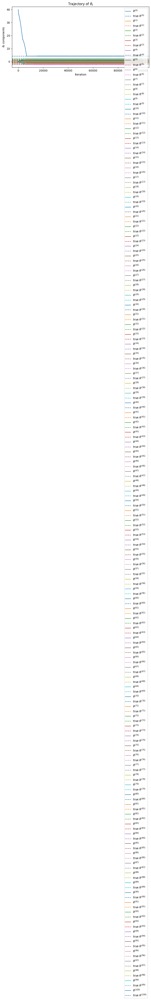

running unsafe Adam...
Final theta: [ 4.27502531  1.61271679 -0.61095991 -0.5301613  -1.06948942  0.86198674
 -2.29772932  1.72362303 -0.75672029  0.30996554 -0.25326297  1.46448174
 -2.06392384 -0.32322194 -0.37499579  1.12481035 -1.10246528 -0.17984691
 -0.87503522  0.04609599  0.58027478 -1.09363905  1.13889797  0.90447312
  0.49514117  0.90794966 -0.67496618 -0.12468827 -0.93382201 -0.27682485
  0.53486041 -0.6855815  -0.39528587 -0.69202867 -0.84340757 -0.66612344
 -0.00841262 -1.12094401  0.23221934  1.6572229   0.7501222  -0.18704463
 -0.88560744 -0.74909989  1.70155319  0.05049079 -0.62226236  0.18902755
  2.09934385  0.11606976  0.61725655  0.30536073 -0.34837226 -1.14102169
 -0.34779286 -0.21293043  0.58724597  0.84376757  0.93532318  0.28568159
  0.88011703 -0.75044545  1.25563237  0.50715699 -0.28997135  0.48834714
 -0.0707711   1.13681487  1.50983521  2.18618846 -1.38767807 -1.44376306
 -0.49424133  0.15598213  0.86580088  0.30832898 -2.01850066 -0.29682219
  0.83087831  0

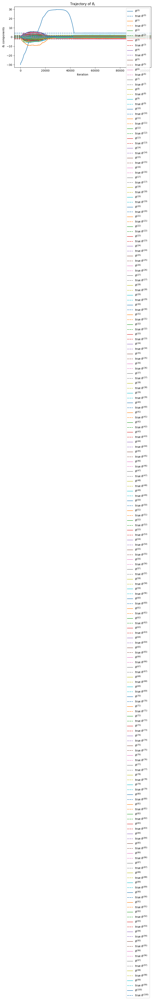

running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with high variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe SGD with harmonic step size with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
running safe Adam with higher variance...
{'SGD_Safe': array([[ 4.00000000e+01,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 3.99900000e+01,  1.46640753e-04, -2.04543990e-04, ...,
        -6.36887142e-06, -3.06170170e-05,  1.27432393e-05],
       [ 3.99800000e+01,  1.31707473e-04, -4.16556328e-04, ...,
         1.01688405e-04,  4.43699541e-05,  2.55158113e-04],
       ...,
       [ 4.26490740e+00,  1.62486264e+00, -6.11630236e-01, ...,
         4.19948460e-02, -6.17896563e-01,  6.99485772e-01],
       [ 4.26448145e+00,  1.62454553e+00,

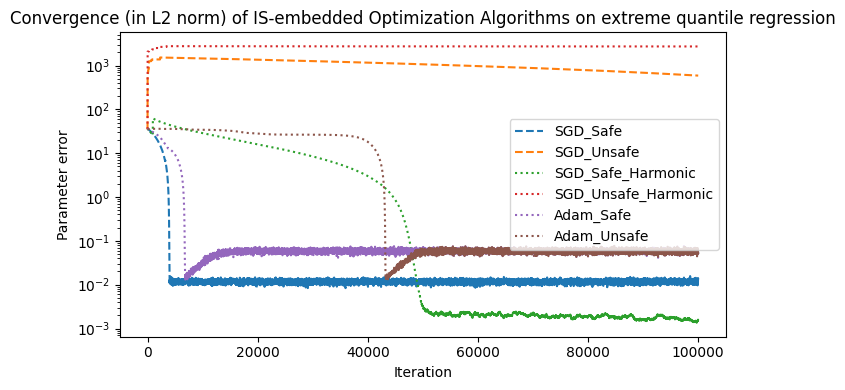

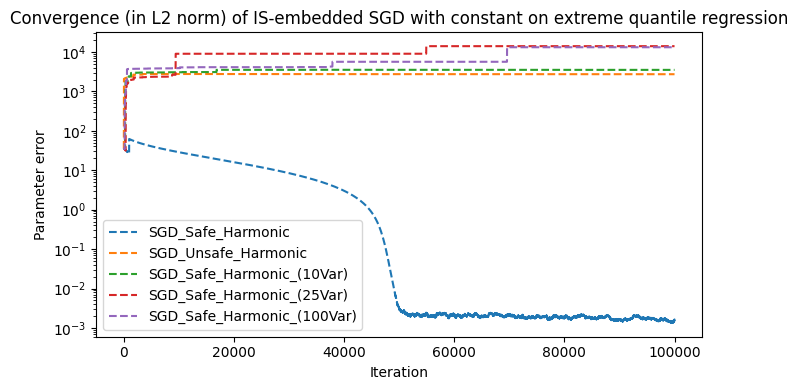

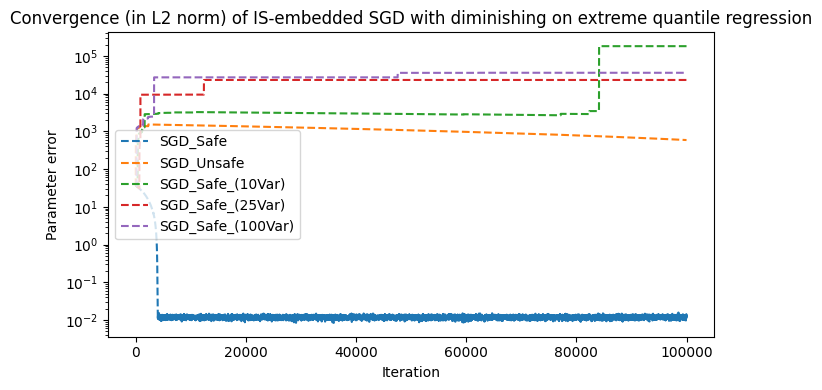

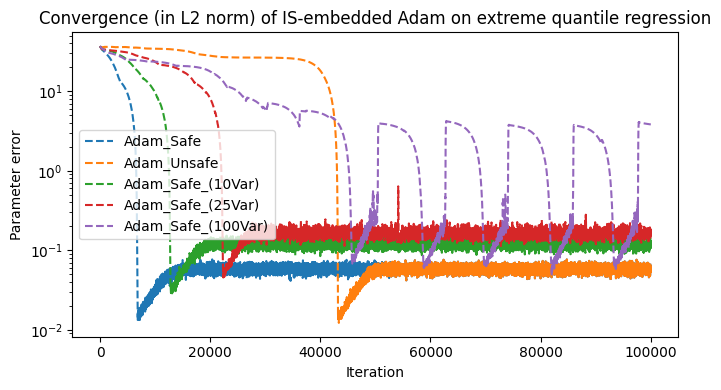

In [ ]:
N_dim = 100
np.random.seed(1)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000,
    check_var = True)

running safe SGD...
Final theta: [ 4.26452456  1.62462226 -0.61214925 -0.52780697 -1.07293026  0.8648711
 -2.30182725  1.74213672 -0.76089148  0.31767093 -0.25035731  1.46145635
 -2.06049889 -0.32439657 -0.38392158  1.13369231 -1.09900191 -0.17194426
 -0.87776302  0.04134972  0.58195402 -1.09899891  1.14417045  0.90018664
  0.50043783  0.90197543 -0.68176473 -0.1240202  -0.93566866 -0.27019531
  0.53144631 -0.69285206 -0.39541934 -0.688136   -0.84456179 -0.66884915
 -0.01161894 -1.11663357  0.23375675  1.66002726  0.74244658 -0.19132466
 -0.88663705 -0.7485593   1.69279222  0.05206289 -0.63732657  0.18903126
  2.10006436  0.1203633   0.61668381  0.3000451  -0.3521848  -1.14398026
 -0.34928034 -0.20834171  0.58665241  0.83949586  0.92947541  0.28415143
  0.88680079 -0.75329958  1.25336444  0.51178892 -0.29682443  0.48807424
 -0.07601935  1.1320333   1.51819588  2.18552649 -1.39560117 -1.44276434
 -0.50390597  0.15945231  0.87615936  0.31532852 -2.02192367 -0.30747002
  0.82560554  0.228

/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/335137980.py:101: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/335137980.py:101: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


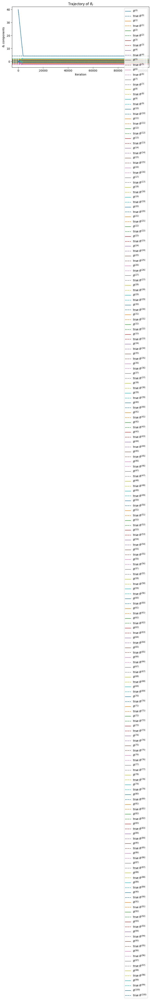

running unsafe SGD...
Final theta: [ 5.80343842e+02  1.53408008e+01  2.06662088e+01 -4.62332112e+00
 -9.84683842e+00  4.51306140e+00 -1.30397132e+01  1.16928611e+00
  6.39014207e+00 -1.67334389e+01 -2.71140935e+01  3.16637052e+00
 -1.36835484e+01  4.14184042e+00 -3.98359666e-01  9.92172151e+00
 -2.83357449e+01 -4.00598476e+00  2.21015318e+01 -3.35915797e-01
  5.04938135e+00  2.69945752e+01  8.21710580e+00  1.08316139e+01
  7.59740250e-01 -1.35458283e+01 -2.29487546e+01 -2.55168993e+01
  5.45249453e+00  6.66429549e-01  1.24836147e+01  1.25102282e+01
  2.16797802e+01  1.03006322e+01 -1.55426543e+01  2.99734444e+01
  1.96076371e+01  2.62457760e+01  3.02179145e+00 -7.79664196e+00
 -4.15467725e+00 -1.46995375e+01 -1.75337048e+01 -8.09490192e+00
  5.12729668e+00  6.26523221e-01 -2.71947870e-01 -6.63440088e+00
  5.50551757e+00  1.01814576e+00  7.46687302e-02  2.74828892e+00
 -4.82790974e+00  2.04316599e+01 -6.97739869e+00  5.21612626e+00
 -3.63776093e+00  1.02885368e+01  1.55617009e+00 -2.404

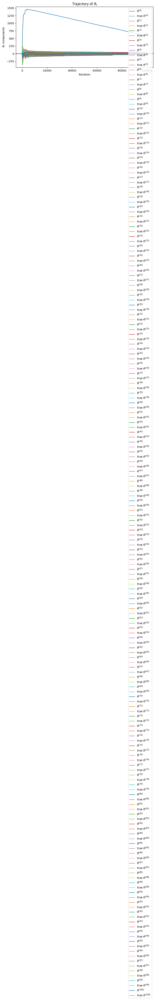

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
running unsafe Adam...
running safe SGD with high variance...


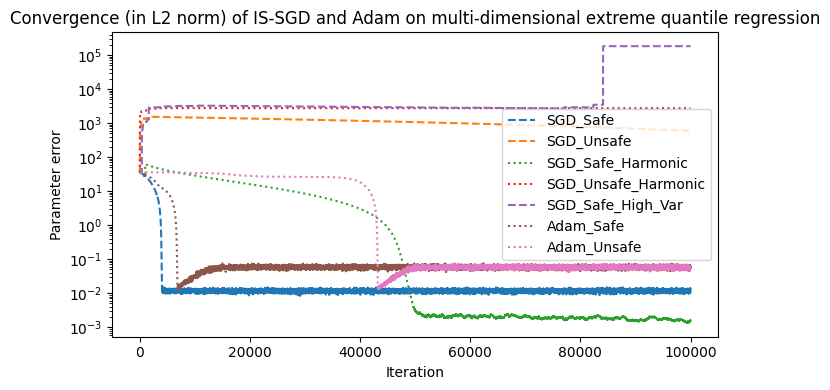

In [ ]:
N_dim = 100
np.random.seed(1)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000)

true_theta: [ 1.62434536 -0.61175641 -0.52817175 -1.07296862  0.86540763 -2.3015387
  1.74481176 -0.7612069   0.3190391  -0.24937038  1.46210794 -2.06014071
 -0.3224172  -0.38405435  1.13376944 -1.09989127 -0.17242821 -0.87785842
  0.04221375  0.58281521 -1.10061918  1.14472371  0.90159072  0.50249434
  0.90085595 -0.68372786 -0.12289023 -0.93576943 -0.26788808  0.53035547
 -0.69166075 -0.39675353 -0.6871727  -0.84520564 -0.67124613 -0.0126646
 -1.11731035  0.2344157   1.65980218  0.74204416 -0.19183555 -0.88762896
 -0.74715829  1.6924546   0.05080775 -0.63699565  0.19091548  2.10025514
  0.12015895  0.61720311  0.30017032 -0.35224985 -1.1425182  -0.34934272
 -0.20889423  0.58662319  0.83898341  0.93110208  0.28558733  0.88514116
 -0.75439794  1.25286816  0.51292982 -0.29809284  0.48851815 -0.07557171
  1.13162939  1.51981682  2.18557541 -1.39649634 -1.44411381 -0.50446586
  0.16003707  0.87616892  0.31563495 -2.02220122 -0.30620401  0.82797464
  0.23009474  0.76201118 -0.22232814 -0.2

/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/Users/wasinmeesena/Library/Python/3.9/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


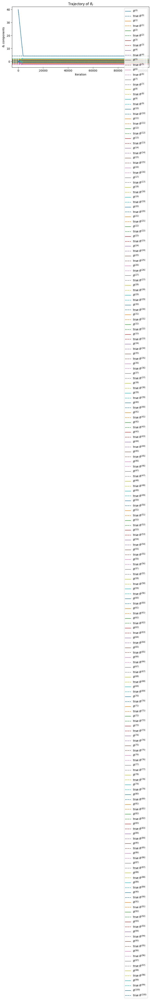

running unsafe SGD...
Final theta: [ 5.80343842e+02  1.53408008e+01  2.06662088e+01 -4.62332112e+00
 -9.84683842e+00  4.51306140e+00 -1.30397132e+01  1.16928611e+00
  6.39014207e+00 -1.67334389e+01 -2.71140935e+01  3.16637052e+00
 -1.36835484e+01  4.14184042e+00 -3.98359666e-01  9.92172151e+00
 -2.83357449e+01 -4.00598476e+00  2.21015318e+01 -3.35915797e-01
  5.04938135e+00  2.69945752e+01  8.21710580e+00  1.08316139e+01
  7.59740250e-01 -1.35458283e+01 -2.29487546e+01 -2.55168993e+01
  5.45249453e+00  6.66429549e-01  1.24836147e+01  1.25102282e+01
  2.16797802e+01  1.03006322e+01 -1.55426543e+01  2.99734444e+01
  1.96076371e+01  2.62457760e+01  3.02179145e+00 -7.79664196e+00
 -4.15467725e+00 -1.46995375e+01 -1.75337048e+01 -8.09490192e+00
  5.12729668e+00  6.26523221e-01 -2.71947870e-01 -6.63440088e+00
  5.50551757e+00  1.01814576e+00  7.46687302e-02  2.74828892e+00
 -4.82790974e+00  2.04316599e+01 -6.97739869e+00  5.21612626e+00
 -3.63776093e+00  1.02885368e+01  1.55617009e+00 -2.404

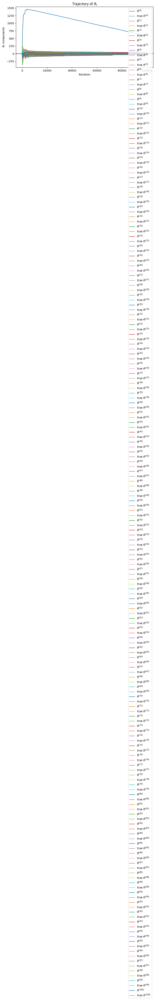

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...


KeyboardInterrupt: 

In [ ]:
N_dim = 100
np.random.seed(1)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000,
    check_var=False)

running safe SGD...
Final theta: [ 4.26452456  1.62462226 -0.61214925 -0.52780697 -1.07293026  0.8648711
 -2.30182725  1.74213672 -0.76089148  0.31767093 -0.25035731  1.46145635
 -2.06049889 -0.32439657 -0.38392158  1.13369231 -1.09900191 -0.17194426
 -0.87776302  0.04134972  0.58195402 -1.09899891  1.14417045  0.90018664
  0.50043783  0.90197543 -0.68176473 -0.1240202  -0.93566866 -0.27019531
  0.53144631 -0.69285206 -0.39541934 -0.688136   -0.84456179 -0.66884915
 -0.01161894 -1.11663357  0.23375675  1.66002726  0.74244658 -0.19132466
 -0.88663705 -0.7485593   1.69279222  0.05206289 -0.63732657  0.18903126
  2.10006436  0.1203633   0.61668381  0.3000451  -0.3521848  -1.14398026
 -0.34928034 -0.20834171  0.58665241  0.83949586  0.92947541  0.28415143
  0.88680079 -0.75329958  1.25336444  0.51178892 -0.29682443  0.48807424
 -0.07601935  1.1320333   1.51819588  2.18552649 -1.39560117 -1.44276434
 -0.50390597  0.15945231  0.87615936  0.31532852 -2.02192367 -0.30747002
  0.82560554  0.228

/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/var/folders/v4/ygpx35493v50lqrtm282cqnm0000gn/T/ipykernel_24634/2011032460.py:98: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


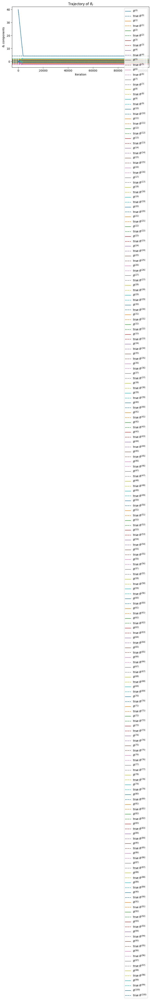

running unsafe SGD...
Final theta: [ 5.80343842e+02  1.53408008e+01  2.06662088e+01 -4.62332112e+00
 -9.84683842e+00  4.51306140e+00 -1.30397132e+01  1.16928611e+00
  6.39014207e+00 -1.67334389e+01 -2.71140935e+01  3.16637052e+00
 -1.36835484e+01  4.14184042e+00 -3.98359666e-01  9.92172151e+00
 -2.83357449e+01 -4.00598476e+00  2.21015318e+01 -3.35915797e-01
  5.04938135e+00  2.69945752e+01  8.21710580e+00  1.08316139e+01
  7.59740250e-01 -1.35458283e+01 -2.29487546e+01 -2.55168993e+01
  5.45249453e+00  6.66429549e-01  1.24836147e+01  1.25102282e+01
  2.16797802e+01  1.03006322e+01 -1.55426543e+01  2.99734444e+01
  1.96076371e+01  2.62457760e+01  3.02179145e+00 -7.79664196e+00
 -4.15467725e+00 -1.46995375e+01 -1.75337048e+01 -8.09490192e+00
  5.12729668e+00  6.26523221e-01 -2.71947870e-01 -6.63440088e+00
  5.50551757e+00  1.01814576e+00  7.46687302e-02  2.74828892e+00
 -4.82790974e+00  2.04316599e+01 -6.97739869e+00  5.21612626e+00
 -3.63776093e+00  1.02885368e+01  1.55617009e+00 -2.404

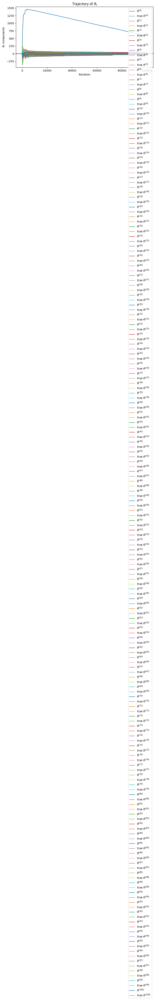

running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
Final theta: [ 4.27502531  1.61271679 -0.61095991 -0.5301613  -1.06948942  0.86198674
 -2.29772932  1.72362303 -0.75672029  0.30996554 -0.25326297  1.46448174
 -2.06392384 -0.32322194 -0.37499579  1.12481035 -1.10246528 -0.17984691
 -0.87503522  0.04609599  0.58027478 -1.09363905  1.13889797  0.90447312
  0.49514117  0.90794966 -0.67496618 -0.12468827 -0.93382201 -0.27682485
  0.53486041 -0.6855815  -0.39528587 -0.69202867 -0.84340757 -0.66612344
 -0.00841262 -1.12094401  0.23221934  1.6572229   0.7501222  -0.18704463
 -0.88560744 -0.74909989  1.70155319  0.05049079 -0.62226236  0.18902755
  2.09934385  0.11606976  0.61725655  0.30536073 -0.34837226 -1.14102169
 -0.34779286 -0.21293043  0.58724597  0.84376757  0.93532318  0.28568159
  0.88011703 -0.75044545  1.25563237  0.50715699 -0.28997135  0.48834714
 -0.0707711   1.13681487  1.50983521  2.18618846 -1.38767807 -1.44376306


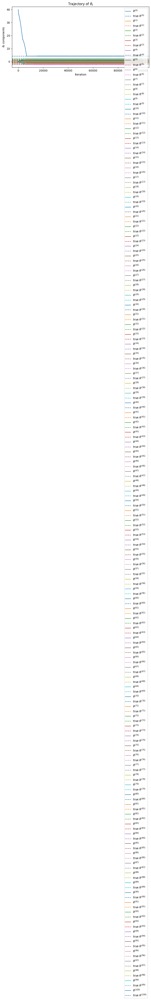

running unsafe Adam...
Final theta: [ 4.27502531  1.61271679 -0.61095991 -0.5301613  -1.06948942  0.86198674
 -2.29772932  1.72362303 -0.75672029  0.30996554 -0.25326297  1.46448174
 -2.06392384 -0.32322194 -0.37499579  1.12481035 -1.10246528 -0.17984691
 -0.87503522  0.04609599  0.58027478 -1.09363905  1.13889797  0.90447312
  0.49514117  0.90794966 -0.67496618 -0.12468827 -0.93382201 -0.27682485
  0.53486041 -0.6855815  -0.39528587 -0.69202867 -0.84340757 -0.66612344
 -0.00841262 -1.12094401  0.23221934  1.6572229   0.7501222  -0.18704463
 -0.88560744 -0.74909989  1.70155319  0.05049079 -0.62226236  0.18902755
  2.09934385  0.11606976  0.61725655  0.30536073 -0.34837226 -1.14102169
 -0.34779286 -0.21293043  0.58724597  0.84376757  0.93532318  0.28568159
  0.88011703 -0.75044545  1.25563237  0.50715699 -0.28997135  0.48834714
 -0.0707711   1.13681487  1.50983521  2.18618846 -1.38767807 -1.44376306
 -0.49424133  0.15598213  0.86580088  0.30832898 -2.01850066 -0.29682219
  0.83087831  0

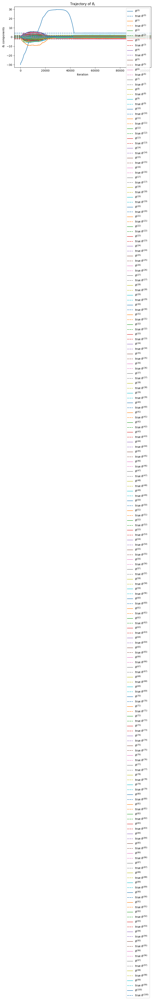

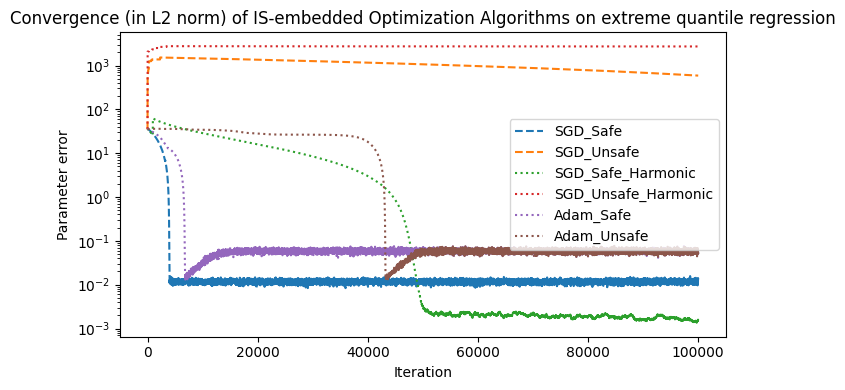

In [ ]:
N_dim = 100
np.random.seed(1)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([40.0] + N_dim * [0.0]),
    unsafe_start = np.array([-30.0] + N_dim * [0.0]),
    T = 100000, 
    batch_size=4000,
    check_var=False)

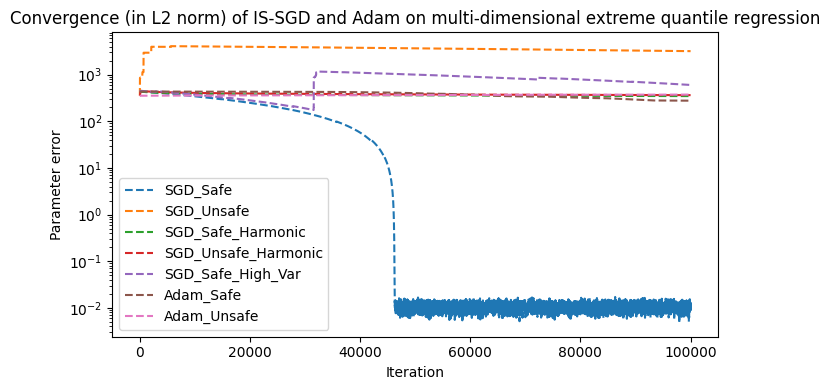

In [ ]:
N_dim = 20
np.random.seed(2)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([400.0] + N_dim * [40.0]),
    unsafe_start = np.array([-300.0] + N_dim * [40.0]),
    T = 100000, 
    batch_size=1000)

running safe SGD...
running unsafe SGD...
running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
running unsafe Adam...
running safe SGD with high variance...


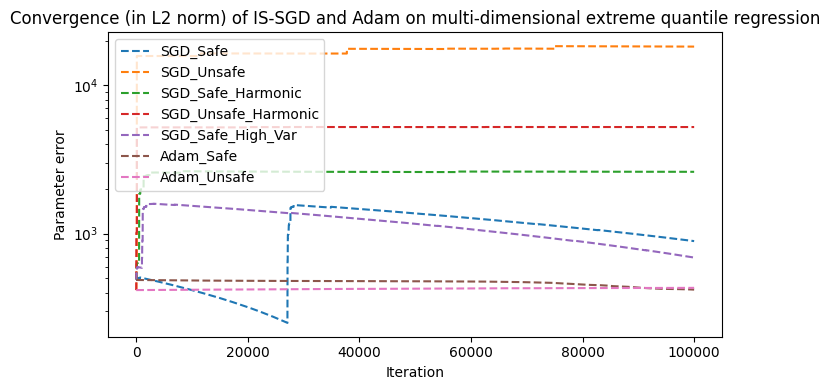

In [ ]:
N_dim = 50
np.random.seed(2)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([400.0] + N_dim * [40.0]),
    unsafe_start = np.array([-300.0] + N_dim * [40.0]),
    T = 100000, 
    batch_size=1000)

running safe SGD...
running unsafe SGD...
running safe SGD with harmonic step size...
running unsafe SGD with harmonic step size...
running safe Adam...
running unsafe Adam...
running safe SGD with high variance...


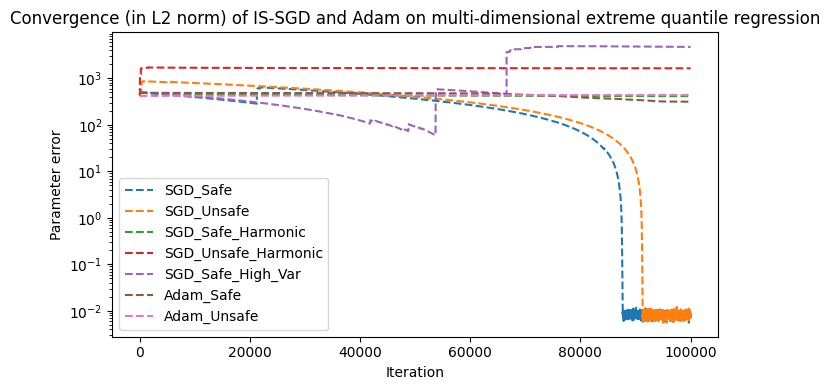

In [ ]:
N_dim = 50
np.random.seed(2)
run_whole_experiment(
    true_theta = np.random.normal(size=N_dim),
    gamma = 100000.0,
    safe_start = np.array([400.0] + N_dim * [40.0]),
    unsafe_start = np.array([-300.0] + N_dim * [40.0]),
    T = 100000, 
    batch_size=4000)

Here, the safe start condition refers to E[Y - estimate]_+ being small. This is small when estimate starts large. that is \theta are positive and large!



Does \theta_0 and \theta_1 have the same effects?



config: [-5.0,2.0,2.0] fails

[-5.0,-2.0,-2.0] not fails 

# Heat map 

In [ ]:
def plot_heatmap(data, title, xlabel="y", ylabel="x"): 
    plt.figure(figsize=(6, 5)) 
    plt.imshow(data, extent=[y_values[0], y_values[-1], x_values[0], x_values[-1]], origin='lower', aspect='auto') 
    plt.colorbar(label=title) 
    plt.xlabel(xlabel) 
    plt.ylabel(ylabel) 
    plt.title(title) 
    plt.tight_layout() 
    plt.show()

In [ ]:
def run_sgd_heat_map(T = 2000,
            gamma = 100, 
            eta0 = 0.01, 
            N_dim = 2,
            batch_size = 100, 
            use_IS = True,
            schedule = "constant",
            seed = 1,
            x_values = np.arange(-200, 100, 5), 
            y_values = np.arange(-30, 31, 5),
            if_plot = False):
    # Result containers
    theta0_grid = np.zeros((len(x_values), len(y_values)))  # For theta_T[0]
    theta1_grid = np.zeros_like(theta0_grid)                # For theta_T[1]
    theta2_grid = np.zeros_like(theta0_grid)                # For theta_T[2]

    X, Y = np.meshgrid(y_values, x_values)
    theta_true = np.ones(N_dim)

    for i, x in enumerate(tqdm(x_values, desc="x loop")):
        for j, y in enumerate(y_values):
            theta0 = np.concatenate((([float(x)], np.ones(N_dim) * float(y))))
            # trace, theta_T = run_sgd(
            #     T=T,
            #     theta0=theta0,
            #     theta_true=theta_true,
            #     gamma=gamma,
            #     eta0=eta0,
            #     batch_size=batch_size,
            #     schedule=schedule,
            #     seed=seed
            # )
            trace, theta_T = run_adam(
                T=T,
                theta0=theta0,
                theta_true=theta_true,
                gamma=gamma,
                eta0=eta0,
                batch_size=batch_size,
                schedule=schedule,
                seed=seed
            )
            theta0_grid[i, j] = theta_T[0]
            theta1_grid[i, j] = theta_T[1]
            theta2_grid[i, j] = theta_T[2]


    if if_plot:
        q = 1 - 1/ gamma
        z_q = norm.ppf(q)
        print("theta_true:",np.concatenate(([z_q],  theta_true)))
                # clip around the corresponding true values
        theta0_grid = np.clip(theta0_grid, z_q - 10, z_q + 10)
        theta0_grid = np.abs(theta0_grid- z_q)
        theta1_grid = np.clip(theta1_grid, theta_true[0] - 10, theta_true[0] + 10)
        theta1_grid = np.abs(theta1_grid-  theta_true[0])
        theta2_grid = np.clip(theta2_grid, theta_true[1] - 10, theta_true[1] + 10)
        theta2_grid = np.abs(theta2_grid-  theta_true[1])

        plot_heatmap(theta0_grid, r"$\theta_T[0]$")
        plot_heatmap(theta1_grid, r"$\theta_T[1]$")
        plot_heatmap(theta2_grid, r"$\theta_T[2]$")


x loop: 100%|██████████| 60/60 [52:00<00:00, 52.01s/it]

theta_true: [2.32634787 1.         1.        ]


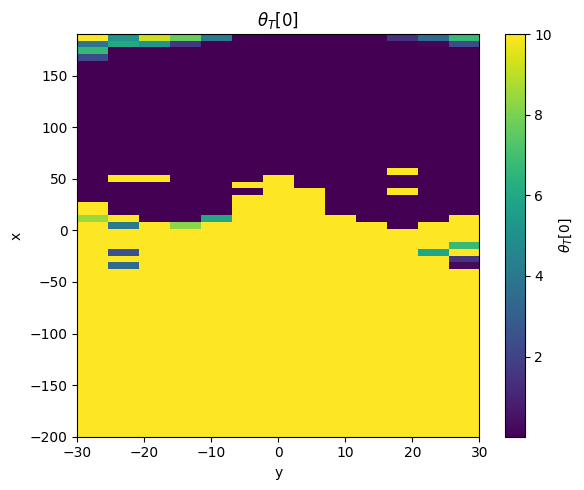

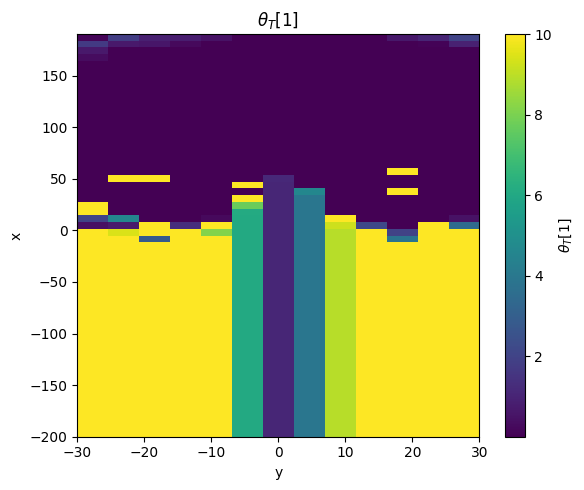

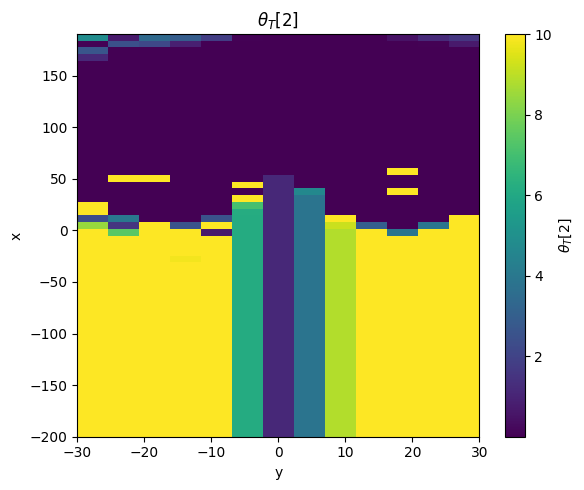

In [ ]:
# variance reduction by batch_size = 100
run_sgd_heat_map(T = 10000,
                gamma = 100, 
                eta0 = 0.01,
                N_dim = 2, 
                schedule = "constant",
                batch_size = 100, 
                 if_plot = True)

x loop: 100%|██████████| 60/60 [3:26:14<00:00, 206.24s/it]  


theta_true: [3.71901649 1.         1.        ]


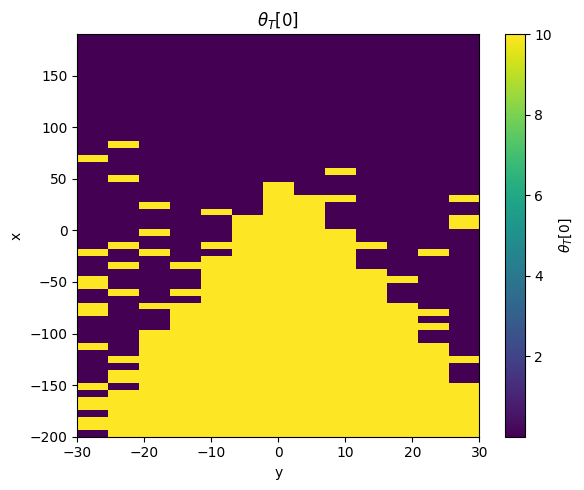

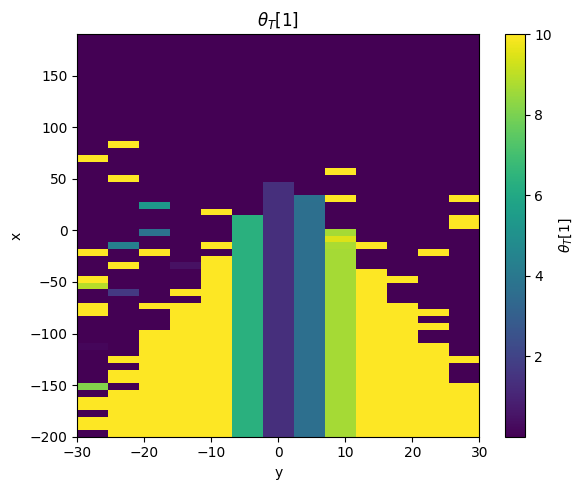

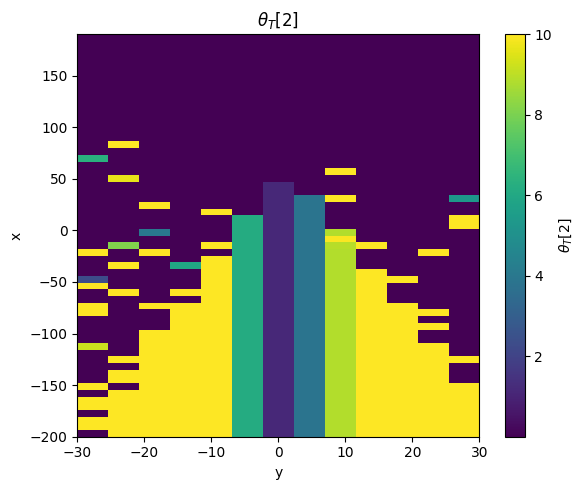

In [ ]:
run_sgd_heat_map(T = 40000,
                gamma = 10000, 
                eta0 = 0.01,
                N_dim = 2, 
                schedule = "constant",
                batch_size = 100, 
                 if_plot = True)

x loop: 100%|██████████| 15/15 [01:49<00:00,  7.29s/it]

theta_true: [2.32634787 1.         1.        ]


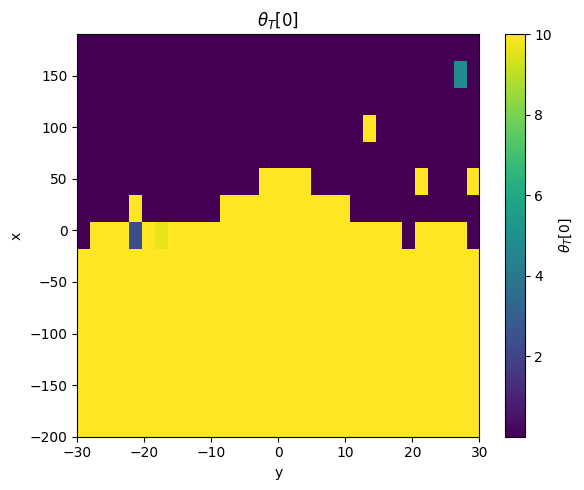

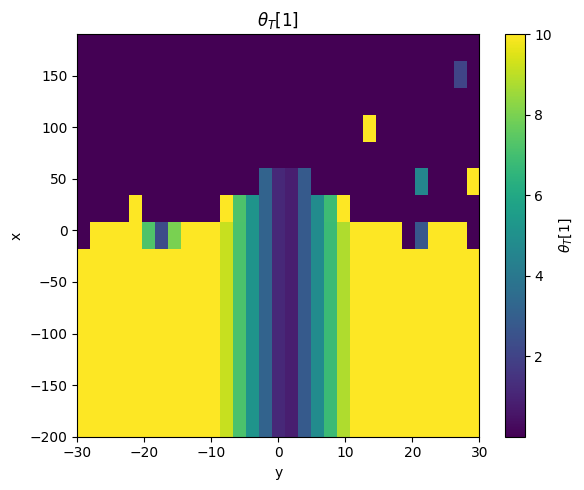

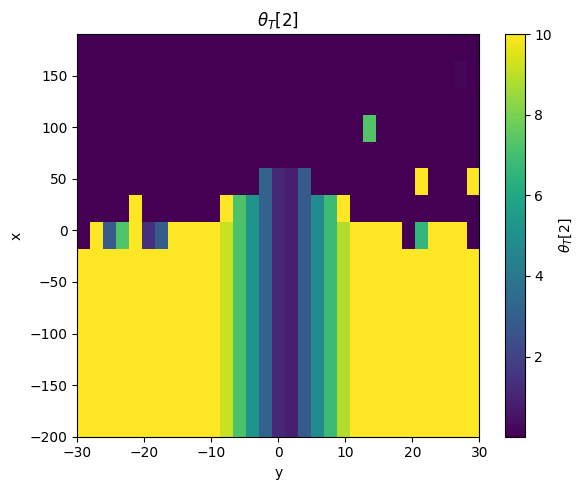

In [ ]:
# variance reduction by batch_size = 100
run_sgd_heat_map(T = 20000,
                gamma = 100, 
                eta0 = 0.01,
                x_values = np.arange(-200, 100, 20), 
                y_values = np.arange(-30, 31, 2),
                N_dim = 2, 
                schedule = "constant",
                batch_size = 100, 
                 if_plot = True)

x loop: 100%|██████████| 15/15 [02:32<00:00, 10.18s/it]


theta_true: [2.32634787 1.         1.        ]


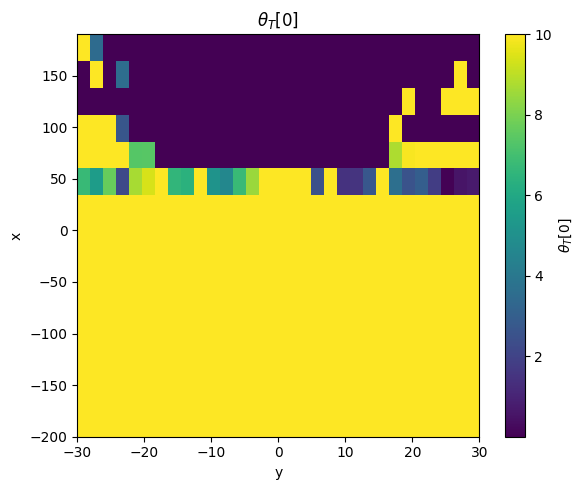

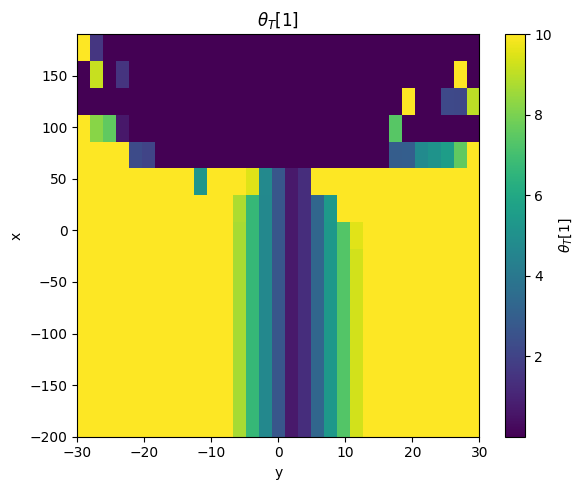

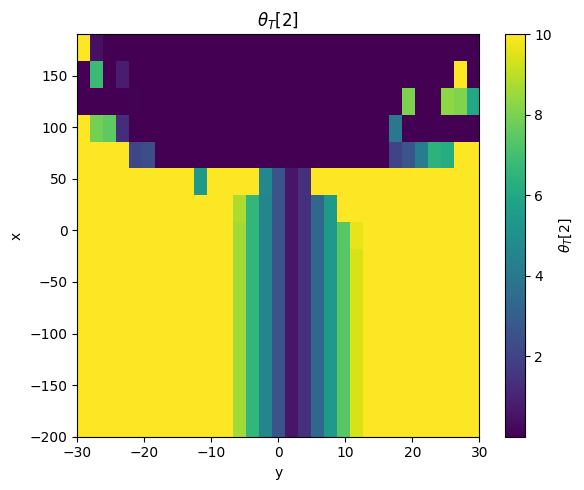

In [ ]:
# running Adam 
run_sgd_heat_map(T = 20000,
                gamma = 100, 
                eta0 = 0.01,
                x_values = np.arange(-200, 100, 20), 
                y_values = np.arange(-30, 31, 2),
                N_dim = 2, 
                schedule = "constant",
                batch_size = 100, 
                 if_plot = True)

x loop: 100%|██████████| 15/15 [10:08<00:00, 40.55s/it]

theta_true: [3.71901649 1.         1.        ]


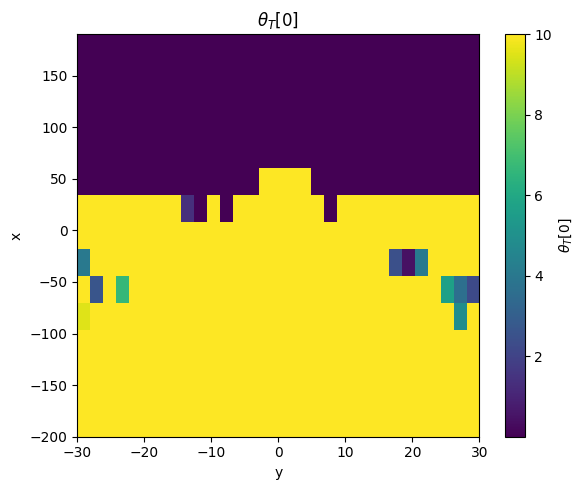

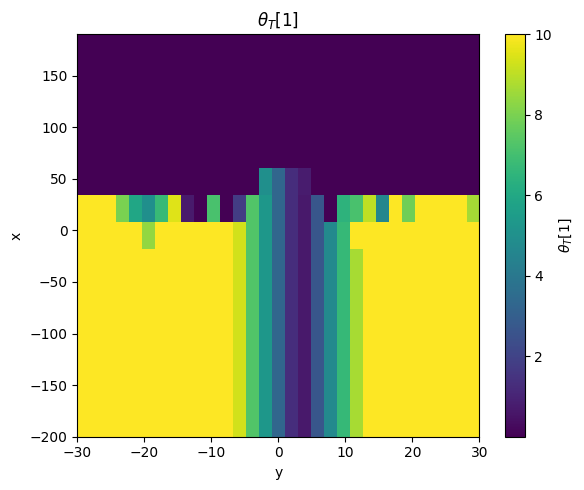

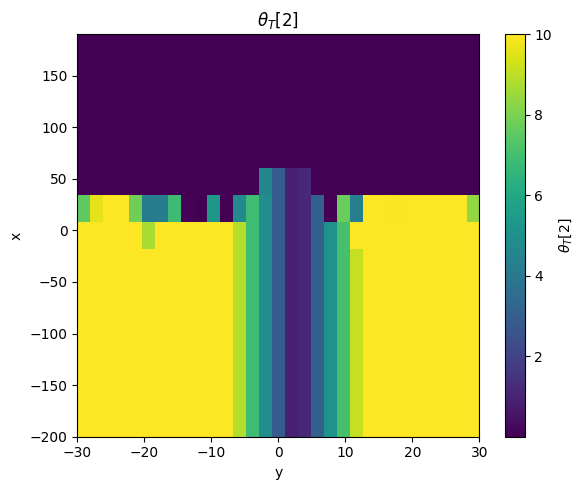

In [ ]:
# running Adam 
run_sgd_heat_map(T = 80000,
                gamma = 10000, 
                eta0 = 0.01,
                x_values = np.arange(-200, 100, 20), 
                y_values = np.arange(-30, 31, 2),
                N_dim = 2, 
                schedule = "constant",
                batch_size = 100, 
                 if_plot = True)

x loop: 100%|██████████| 15/15 [1:24:01<00:00, 336.10s/it]  


theta_true: [3.71901649 1.         1.        ]


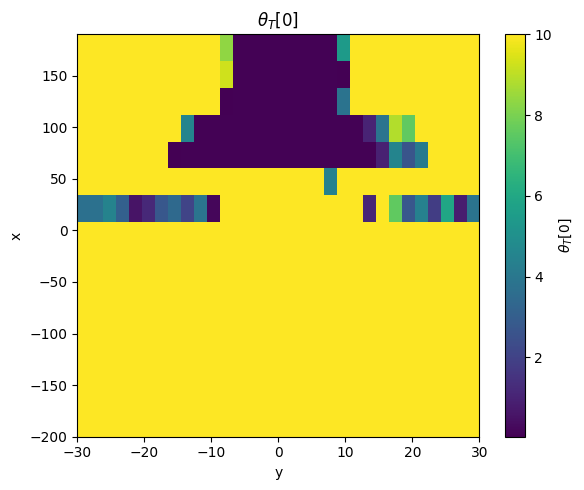

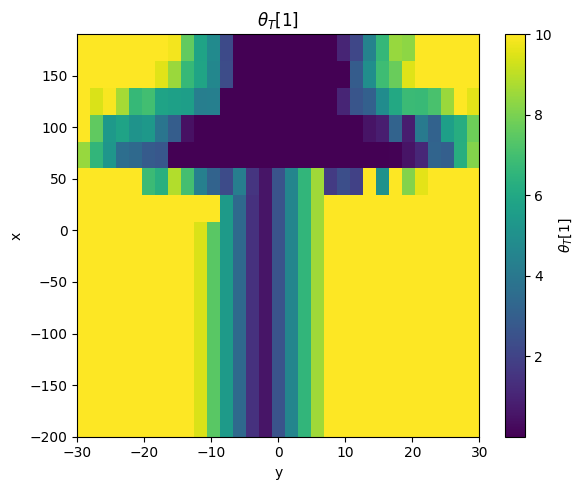

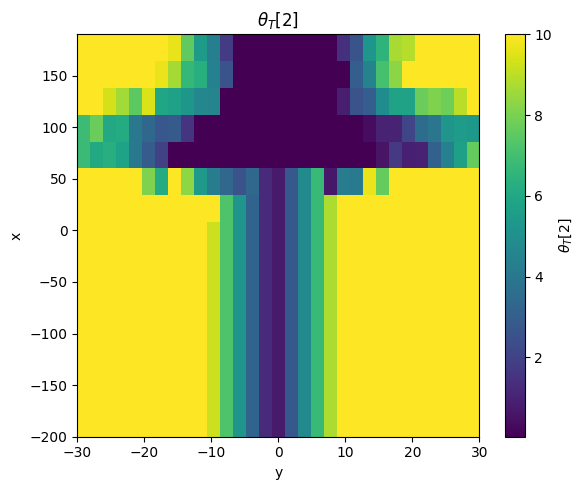

In [ ]:
# running Adam 
run_sgd_heat_map(T = 80000,
                gamma = 10000, 
                eta0 = 0.01,
                x_values = np.arange(-200, 100, 20), 
                y_values = np.arange(-30, 31, 2),
                N_dim = 2, 
                schedule = "constant",
                batch_size = 1, 
                 if_plot = True)

## Multi Dimension Settings

# Adam in two dimensional Settings